#### Author: Gioele Eterno

In [151]:
import pandas as pd
#pd.set_option('display.max_columns', 50)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import BisectingKMeans
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster 
from sklearn.manifold import TSNE

# Clustering
Prepare your preprocessed dataset for clustering
- do you need to remove some variables?
- do you need to normalize?

Let's start from the dataset of the previous notebook

In [152]:
df = pd.read_csv('aac_dogs_01.csv')
df.head()

,date_of_birth,outcome_subtype,outcome_type,sex_upon_outcome,outcome_datetime,breed,color,intake_condition,intake_type,sex_upon_intake,intake_datetime,breed_avg_life_expectancy,breed_avg_height,breed_avg_weight,good_with_children,good_with_other_dogs,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,breed_type,top6_breeds,age_upon_intake,age_upon_outcome,length_of_stay
0,2017-03-08,Foster,Adoption,Intact Male,2017-05-09 07:48:00,Greyhound Mix,Tan,Normal,Stray,Intact Male,2017-04-08 17:42:00,11.5,29.00,65.0,2.625100,3.615374,3.506990,0.365627,0.218111,0.396311,2.177002,3.191688,3.390986,2.873580,4.167703,1.974363,mix,False,0.084932,0.169863,0.082192
1,2016-07-03,Foster,Adoption,Spayed Female,2016-09-10 17:22:00,Boxer Mix,Brown/White,Normal,Stray,Intact Female,2016-08-09 11:42:00,11.0,24.00,65.0,5.835203,2.925542,1.663397,2.324304,3.481632,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943,mix,False,0.101370,0.189041,0.087671
2,2010-02-10,Partner,Transfer,Intact Male,2018-03-01 16:27:00,Chihuahua Shorthair Mix,Red,Normal,Stray,Intact Male,2018-02-24 11:46:00,15.0,6.50,5.0,2.544920,4.314612,3.359707,0.217080,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286,mix,True,8.043836,8.057534,0.013699
3,2006-10-22,Partner,Transfer,Neutered Male,2015-10-28 14:12:00,Pomeranian Mix,White/Black,Normal,Stray,Intact Male,2015-10-22 11:09:00,14.0,6.50,5.0,2.835409,2.936067,3.165869,2.045838,0.475766,1.696648,2.523325,2.203599,3.770284,3.482516,2.037904,3.420557,mix,False,9.005479,9.021918,0.016438
4,2016-09-07,Partner,Transfer,Spayed Female,2017-09-16 16:01:00,Shih Tzu Mix,White/Brown,Normal,Stray,Spayed Female,2017-09-12 10:47:00,14.0,9.75,12.5,4.391545,4.955892,0.172306,3.903627,0.360951,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888,mix,False,1.013699,1.024658,0.010959


In [153]:
df.columns

Index(['date_of_birth', 'outcome_subtype', 'outcome_type', 'sex_upon_outcome',
       'outcome_datetime', 'breed', 'color', 'intake_condition', 'intake_type',
       'sex_upon_intake', 'intake_datetime', 'breed_avg_life_expectancy',
       'breed_avg_height', 'breed_avg_weight', 'good_with_children',
       'good_with_other_dogs', 'shedding', 'grooming', 'drooling',
       'coat_length', 'good_with_strangers', 'playfulness', 'protectiveness',
       'trainability', 'energy', 'barking', 'breed_type', 'top6_breeds',
       'age_upon_intake', 'age_upon_outcome', 'length_of_stay'],
      dtype='object')

The aim of this clustering analysis is to see if the clusterization obtained by considering the attributes `breed_avg_life_expectancy`, `breed_avg_height`, `good_with_children`, `good_with_other_dogs`, `shedding`, `grooming`, `drooling`, `coat_length`, `good_with_strangers`, `playfulness`, `protectiveness`, `trainability`, `energy`, `barking`, `breed_type`, `age_upon_outcome` and `length_of_stay`, is compatible with the natural grouping by `breed`. Notice that `breed_type` is a categorical variable so we first need to one-hot encode it in order to include it among the numerical attributes.

In [154]:
df = pd.get_dummies(df, columns=['breed_type'], prefix_sep='=', drop_first=False, dtype=int)

In [155]:
df.columns

Index(['date_of_birth', 'outcome_subtype', 'outcome_type', 'sex_upon_outcome',
       'outcome_datetime', 'breed', 'color', 'intake_condition', 'intake_type',
       'sex_upon_intake', 'intake_datetime', 'breed_avg_life_expectancy',
       'breed_avg_height', 'breed_avg_weight', 'good_with_children',
       'good_with_other_dogs', 'shedding', 'grooming', 'drooling',
       'coat_length', 'good_with_strangers', 'playfulness', 'protectiveness',
       'trainability', 'energy', 'barking', 'top6_breeds', 'age_upon_intake',
       'age_upon_outcome', 'length_of_stay', 'breed_type=hybrid',
       'breed_type=mix', 'breed_type=pure'],
      dtype='object')

To do so, firstly we can consider all of the breeds in the Dataframe:

In [156]:
df_breed = df[['breed', 'breed_avg_life_expectancy', 'breed_avg_height', 'good_with_children', 'good_with_other_dogs', 'shedding', 'grooming',
       'drooling', 'coat_length', 'good_with_strangers', 'playfulness', 'protectiveness', 'trainability', 'energy', 'barking', 'age_upon_outcome', 'length_of_stay',
       'breed_type=hybrid', 'breed_type=mix', 'breed_type=pure']]

In [157]:
df_breed.head()

,breed,breed_avg_life_expectancy,breed_avg_height,good_with_children,good_with_other_dogs,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,age_upon_outcome,length_of_stay,breed_type=hybrid,breed_type=mix,breed_type=pure
0,Greyhound Mix,11.5,29.00,2.625100,3.615374,3.506990,0.365627,0.218111,0.396311,2.177002,3.191688,3.390986,2.873580,4.167703,1.974363,0.169863,0.082192,0,1,0
1,Boxer Mix,11.0,24.00,5.835203,2.925542,1.663397,2.324304,3.481632,1.720616,4.839427,3.916796,3.144705,3.010407,4.231642,2.737943,0.189041,0.087671,0,1,0
2,Chihuahua Shorthair Mix,15.0,6.50,2.544920,4.314612,3.359707,0.217080,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286,8.057534,0.013699,0,1,0
3,Pomeranian Mix,14.0,6.50,2.835409,2.936067,3.165869,2.045838,0.475766,1.696648,2.523325,2.203599,3.770284,3.482516,2.037904,3.420557,9.021918,0.016438,0,1,0
4,Shih Tzu Mix,14.0,9.75,4.391545,4.955892,0.172306,3.903627,0.360951,0.162845,3.372774,3.094009,2.924166,4.698562,2.944130,2.754888,1.024658,0.010959,0,1,0


Then we can do the same by restrcting to the top 6 breeds since, as seen in the previous notebook, they cover more than the $50\%$ of the whole dataset:

In [158]:
df_top6_breed = df[df['top6_breeds'] == True]
df_top6_breed = df_top6_breed[['breed', 'breed_avg_life_expectancy', 'breed_avg_height', 'good_with_children', 'good_with_other_dogs', 'shedding', 'grooming',
       'drooling', 'coat_length', 'good_with_strangers', 'playfulness', 'protectiveness', 'trainability', 'energy', 'barking', 'age_upon_outcome', 'length_of_stay',
       'breed_type=hybrid', 'breed_type=mix', 'breed_type=pure']]

In [159]:
df_top6_breed.head()

,breed,breed_avg_life_expectancy,breed_avg_height,good_with_children,good_with_other_dogs,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,age_upon_outcome,length_of_stay,breed_type=hybrid,breed_type=mix,breed_type=pure
2,Chihuahua Shorthair Mix,15.0,6.5,2.544920,4.314612,3.359707,0.217080,0.000000,1.507057,2.740278,3.577027,3.620172,1.832087,2.834511,5.015286,8.057534,0.013699,0,1,0
8,Labrador Retriever Mix,11.0,23.5,4.809675,4.322941,4.946290,2.572693,1.777277,0.965470,4.655712,7.119640,3.575653,4.514976,5.404228,4.506239,0.019178,0.000000,0,1,0
10,Labrador Retriever Mix,11.0,23.5,3.953542,4.986647,4.143614,1.751516,2.406355,0.771277,4.999612,5.344255,3.028714,5.510420,5.371233,3.536094,2.438356,0.432877,0,1,0
12,Chihuahua Shorthair Mix,15.0,6.5,0.991643,3.702627,1.689304,0.376381,1.508311,1.662615,1.001461,4.095736,5.068481,2.297823,5.247786,5.168939,7.386301,0.109589,0,1,0
13,Australian Cattle Dog Mix,14.0,19.0,3.156490,2.066299,3.189726,1.281063,1.370736,1.450500,2.648603,2.693606,3.954998,4.359953,5.341469,1.022448,2.019178,0.016438,0,1,0


And of course before doing the actual clustering analysis we have to normalize the data in order to have all of the attribute values in the same range (e.g. $[0,1]$):

In [160]:
minmaxscaler = MinMaxScaler()

In [161]:
df_breed.iloc[:,1:] = minmaxscaler.fit_transform(df_breed.iloc[:,1:])
df_top6_breed.iloc[:,1:] = minmaxscaler.fit_transform(df_top6_breed.iloc[:,1:])

In [162]:
df_breed.head()

,breed,breed_avg_life_expectancy,breed_avg_height,good_with_children,good_with_other_dogs,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,age_upon_outcome,length_of_stay,breed_type=hybrid,breed_type=mix,breed_type=pure
0,Greyhound Mix,0.500000,0.918367,0.361124,0.504162,0.572529,0.054644,0.033554,0.096436,0.309695,0.448293,0.485053,0.389159,0.573522,0.271452,0.008812,0.023904,0,1,0
1,Boxer Mix,0.428571,0.714286,0.802724,0.407965,0.271556,0.347375,0.535618,0.418684,0.688445,0.550140,0.449825,0.407689,0.582321,0.376436,0.009807,0.025498,0,1,0
2,Chihuahua Shorthair Mix,1.000000,0.000000,0.350094,0.601670,0.548485,0.032443,0.000000,0.366718,0.389825,0.502417,0.517836,0.248113,0.390060,0.689544,0.417993,0.003984,0,1,0
3,Pomeranian Mix,0.857143,0.000000,0.390055,0.409433,0.516840,0.305757,0.073192,0.412852,0.358962,0.309510,0.539309,0.471625,0.280438,0.470287,0.468022,0.004781,0,1,0
4,Shih Tzu Mix,0.857143,0.132653,0.604126,0.691096,0.028130,0.583410,0.055529,0.039626,0.479802,0.434574,0.418278,0.636310,0.405145,0.378765,0.053155,0.003187,0,1,0


In [163]:
df_top6_breed.head()

,breed,breed_avg_life_expectancy,breed_avg_height,good_with_children,good_with_other_dogs,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,age_upon_outcome,length_of_stay,breed_type=hybrid,breed_type=mix,breed_type=pure
2,Chihuahua Shorthair Mix,1.00,0.000000,0.350094,0.614573,0.548485,0.048346,0.000000,0.366718,0.389825,0.415735,0.530224,0.174643,0.322683,0.692447,0.423714,0.003984,0,0,0
8,Labrador Retriever Mix,0.00,0.918919,0.661647,0.615759,0.807500,0.572963,0.458261,0.234931,0.662310,1.000000,0.521699,0.573481,0.741424,0.622165,0.001009,0.000000,0,0,0
10,Labrador Retriever Mix,0.00,0.918919,0.543872,0.710298,0.676460,0.390079,0.620465,0.187678,0.711232,0.707195,0.416967,0.721463,0.736047,0.488219,0.128224,0.125896,0,0,0
12,Chihuahua Shorthair Mix,1.00,0.000000,0.136416,0.527402,0.275785,0.083823,0.388909,0.404570,0.142465,0.501283,0.807557,0.243879,0.715931,0.713662,0.388417,0.031873,0,0,0
13,Australian Cattle Dog Mix,0.75,0.675676,0.434225,0.294324,0.520735,0.285305,0.353436,0.352955,0.376784,0.270037,0.594339,0.550435,0.731197,0.141167,0.106181,0.004781,0,0,0


## Centroid-Based
- identify the best parameter choice (k)
- use plots to visualize the clusters (you can use dimensionality reduction techniques)
- evaluate quantitatively and qualitatively:
    - compare the clusters with some categorical variable (for example using crosstab, or scatter plots)
    - evaluate the clusters using some quantitative metric (e.g., silhouette)
    - do you see something interesting?

Let's start with centroid based clustering.

In [164]:
X = np.array(df_breed.iloc[:,1:])
X

array([[0.5       , 0.91836735, 0.36112389, ..., 0.        , 1.        ,
        0.        ],
       [0.42857143, 0.71428571, 0.80272434, ..., 0.        , 1.        ,
        0.        ],
       [1.        , 0.        , 0.35009386, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.64285714, 0.6122449 , 0.3468    , ..., 0.        , 1.        ,
        0.        ],
       [0.64285714, 0.6122449 , 0.45940593, ..., 0.        , 0.        ,
        1.        ],
       [0.64285714, 0.6122449 , 0.50621902, ..., 0.        , 1.        ,
        0.        ]])

To evaluate the best number of clusters we plot both the 'SSE' and the 'Silhouette score' as a function of the number of clusetrs $k$. The best value for $k$ is the one that falls near the 'elbow' of the SSE vs $k$ curve and that maximizes the Silhouette score.

In [165]:
k_min = 2
k_max = 15

k_values = np.arange(k_min, k_max)
sse_values = list()
sil_values = list()

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=100, random_state=42)
    kmeans.fit(X)
    sse_values.append(kmeans.inertia_)
    sil_values.append(silhouette_score(X, kmeans.labels_))

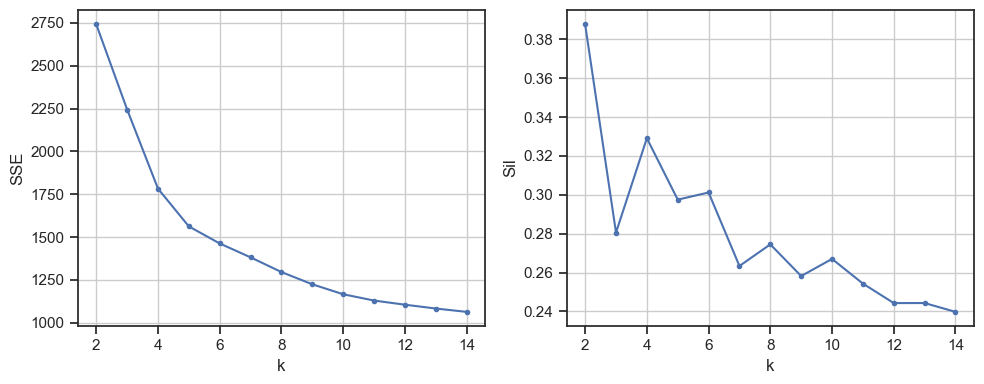

In [166]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))  # 1 row, 2 columns

# First plot (left)
axes[0].plot(k_values, sse_values, marker='.')
axes[0].set_xlabel('k')
axes[0].set_ylabel('SSE')
axes[0].grid()

# Second plot (right)
axes[1].plot(k_values, sil_values, marker = '.')
axes[1].set_xlabel('k')
axes[1].set_ylabel('Sil')
axes[1].grid()

# Adjust layout and show plot
plt.tight_layout()
plt.show()

From the two plots above we deduce that a good choice could be $k = 4$:

The `random_state = 42` makes the algorithm deterministic and `n_init` is the number of iterations of K-Means that are done (the one with the best SSE is then returned).

In [167]:
kmeans = KMeans(n_clusters=4, n_init=100, random_state=42)

In [168]:
kmeans.fit(X)

KMeans(n_clusters=4, n_init=100, random_state=42)

Let's create a copy of the Dataframe in which we will add the columns containing the labels of the clustering procedure

In [169]:
df_breed_copy = df_breed.copy(deep=True)

In [170]:
df_breed_copy.head()

,breed,breed_avg_life_expectancy,breed_avg_height,good_with_children,good_with_other_dogs,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,age_upon_outcome,length_of_stay,breed_type=hybrid,breed_type=mix,breed_type=pure
0,Greyhound Mix,0.500000,0.918367,0.361124,0.504162,0.572529,0.054644,0.033554,0.096436,0.309695,0.448293,0.485053,0.389159,0.573522,0.271452,0.008812,0.023904,0,1,0
1,Boxer Mix,0.428571,0.714286,0.802724,0.407965,0.271556,0.347375,0.535618,0.418684,0.688445,0.550140,0.449825,0.407689,0.582321,0.376436,0.009807,0.025498,0,1,0
2,Chihuahua Shorthair Mix,1.000000,0.000000,0.350094,0.601670,0.548485,0.032443,0.000000,0.366718,0.389825,0.502417,0.517836,0.248113,0.390060,0.689544,0.417993,0.003984,0,1,0
3,Pomeranian Mix,0.857143,0.000000,0.390055,0.409433,0.516840,0.305757,0.073192,0.412852,0.358962,0.309510,0.539309,0.471625,0.280438,0.470287,0.468022,0.004781,0,1,0
4,Shih Tzu Mix,0.857143,0.132653,0.604126,0.691096,0.028130,0.583410,0.055529,0.039626,0.479802,0.434574,0.418278,0.636310,0.405145,0.378765,0.053155,0.003187,0,1,0


In [171]:
df_breed_copy['KMeans_Labels'] = kmeans.labels_

The number of dogs in each cluster is the following:

In [172]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2, 3]), array([ 916,  789, 2346,  323], dtype=int64))

And the Silhouette score for this clusterization is:

In [173]:
silhouette_score(X, df_breed_copy['KMeans_Labels'].values)

0.32910866296090885

The Silhouette typically ranges between $0$ and $1$ and the closer to $1$ the better is the clustering. In this case we obtain $\sim 0.33$.

Let's do now some plots.

The following scatter matrices compare the result of the clustering with the grouping by `breed`. The attributes used are: `good_with_children`, `good_with_other_dogs`, `good_with_strangers`, `playfulness`, `protectiveness`, `trainability`, `energy`, `barking`, `shedding`, `grooming`, `drooling` and `coat_length`.

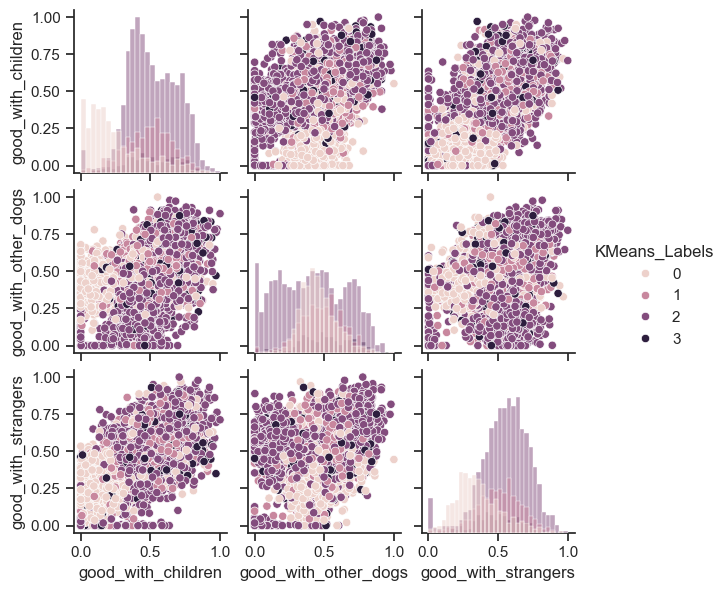

In [174]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy, diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'KMeans_Labels', height=2)

plt.show()

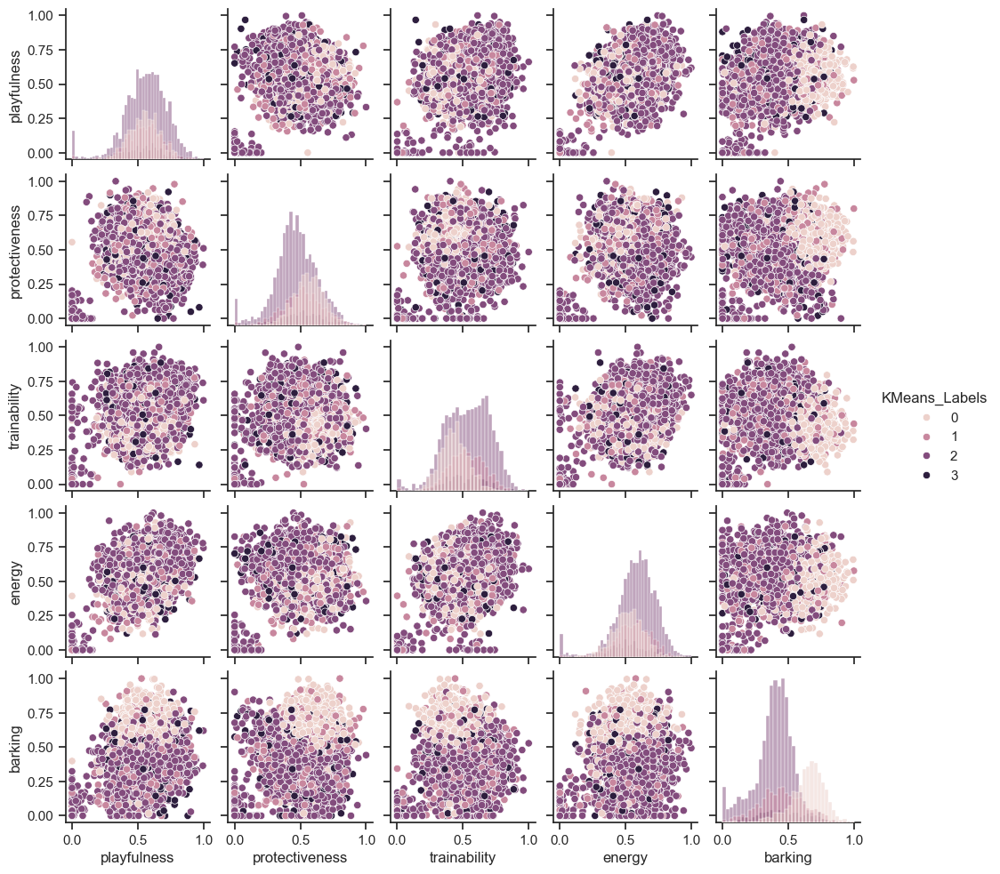

In [175]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy, diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'KMeans_Labels', height=2)

plt.show()

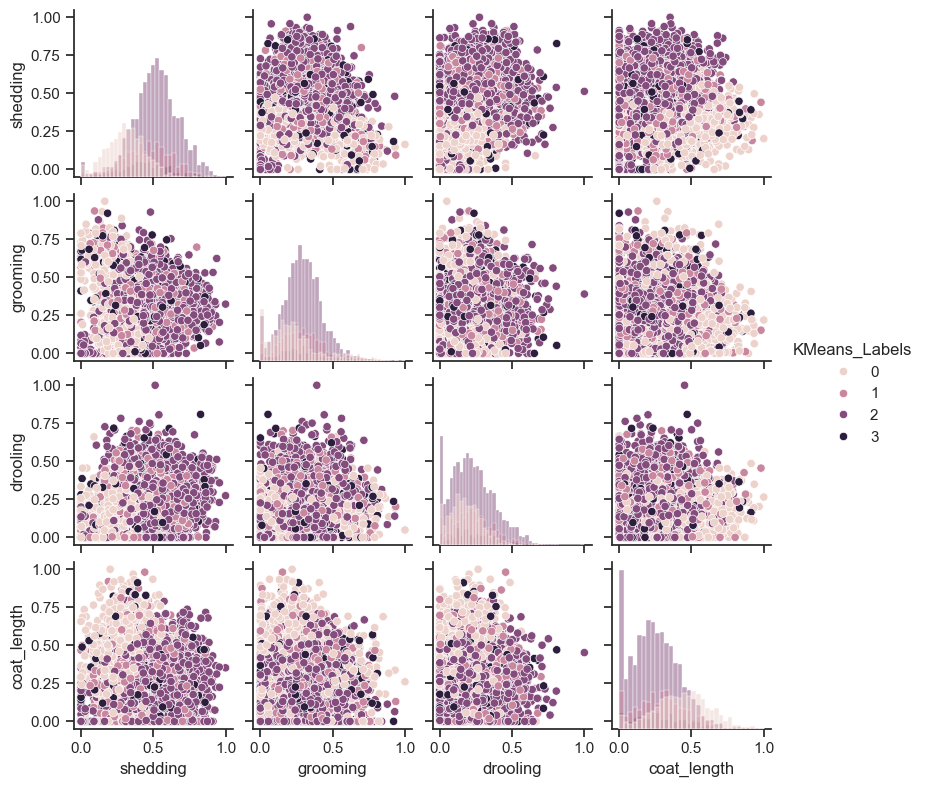

In [176]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy, diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'KMeans_Labels', height=2)

plt.show()

By considering all the breeds the result of the clusterization, as seen in the plots above, is not easily readable. This is obvious since we are clustering over $500$ breeds into $4$ clusters. Let's see if clearer results can be obtained by restricting the considered breed to the top 6.

Notice that there are some points that seem to be aligned with the $x=0$ or with $y=0$. This is because there are some dogs that have one of the considered attribute as $0.0$. This was not considered a missing value since the features from `breed_avg_life_expectancy` up to `barking` range from $0$ to $5$ (in this analysis are normalized between $0$ and $1$).

In [177]:
X_top6 = np.array(df_top6_breed.iloc[:,1:])

In [178]:
X_top6

array([[1.        , 0.        , 0.35009386, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.91891892, 0.66164673, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.91891892, 0.54387206, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.75      , 0.67567568, 0.51550583, ..., 0.        , 0.        ,
        0.        ],
       [0.375     , 0.81081081, 0.3468    , ..., 0.        , 0.        ,
        0.        ],
       [0.375     , 0.81081081, 0.50621902, ..., 0.        , 0.        ,
        0.        ]])

To evaluate the best number of clusters we plot both the 'SSE' and the 'Silhouette score' as a function of the number of clusetrs $k$. The best value for $k$ is the one that falls near the 'elbow' of the SSE vs $k$ curve and that maximizes the Silhouette score.

In [179]:
k_min = 2
k_max = 15

k_values = np.arange(k_min, k_max)
sse_values_top6 = list()
sil_values_top6 = list()

for k in k_values:
    kmeans_top6 = KMeans(n_clusters=k, n_init=100, random_state=42)
    kmeans_top6.fit(X_top6)
    sse_values_top6.append(kmeans_top6.inertia_)
    sil_values_top6.append(silhouette_score(X_top6, kmeans_top6.labels_))

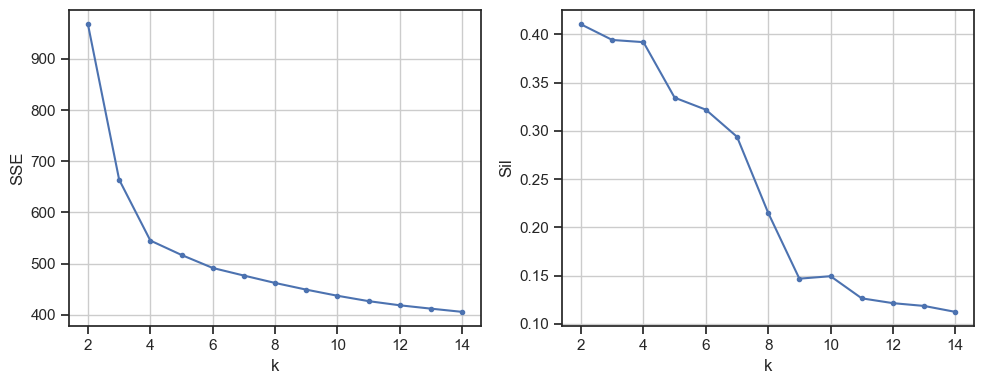

In [180]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))  # 1 row, 2 columns

# First plot (left)
axes[0].plot(k_values, sse_values_top6, marker='.')
axes[0].set_xlabel('k')
axes[0].set_ylabel('SSE')
axes[0].grid()

# Second plot (right)
axes[1].plot(k_values, sil_values_top6, marker = '.')
axes[1].set_xlabel('k')
axes[1].set_ylabel('Sil')
axes[1].grid()

# Adjust layout and show plot
plt.tight_layout()
plt.show()

Also in this case the best number of clusters seems to be $k = 4$

The `random_state = 42` makes the algorithm deterministic and `n_init` is the number of iterations of K-Means that are done (the one with the best SSE is then returned).

In [181]:
kmeans_top6 = KMeans(n_clusters=4, n_init=100, random_state=42)

In [182]:
kmeans_top6.fit(X_top6)

KMeans(n_clusters=4, n_init=100, random_state=42)

Let's create a copy of the Dataframe in which we will add the columns containing the labels of the clustering procedure

In [183]:
df_top6_breed_copy = df_top6_breed.copy(deep=True)

In [184]:
df_top6_breed_copy.head()

,breed,breed_avg_life_expectancy,breed_avg_height,good_with_children,good_with_other_dogs,shedding,grooming,drooling,coat_length,good_with_strangers,playfulness,protectiveness,trainability,energy,barking,age_upon_outcome,length_of_stay,breed_type=hybrid,breed_type=mix,breed_type=pure
2,Chihuahua Shorthair Mix,1.00,0.000000,0.350094,0.614573,0.548485,0.048346,0.000000,0.366718,0.389825,0.415735,0.530224,0.174643,0.322683,0.692447,0.423714,0.003984,0,0,0
8,Labrador Retriever Mix,0.00,0.918919,0.661647,0.615759,0.807500,0.572963,0.458261,0.234931,0.662310,1.000000,0.521699,0.573481,0.741424,0.622165,0.001009,0.000000,0,0,0
10,Labrador Retriever Mix,0.00,0.918919,0.543872,0.710298,0.676460,0.390079,0.620465,0.187678,0.711232,0.707195,0.416967,0.721463,0.736047,0.488219,0.128224,0.125896,0,0,0
12,Chihuahua Shorthair Mix,1.00,0.000000,0.136416,0.527402,0.275785,0.083823,0.388909,0.404570,0.142465,0.501283,0.807557,0.243879,0.715931,0.713662,0.388417,0.031873,0,0,0
13,Australian Cattle Dog Mix,0.75,0.675676,0.434225,0.294324,0.520735,0.285305,0.353436,0.352955,0.376784,0.270037,0.594339,0.550435,0.731197,0.141167,0.106181,0.004781,0,0,0


In [185]:
df_top6_breed_copy['KMeans_Labels'] = kmeans_top6.labels_

Having a small number of breeds, in this case it can be useful to do a crosstab between the 6 breeds and the K-Means labels

In [186]:
pd.crosstab(df_top6_breed_copy['breed'], df_top6_breed_copy['KMeans_Labels'])

KMeans_Labels,0,1,2,3
breed,,,,
Australian Cattle Dog Mix,0,0,0,120
Chihuahua Shorthair Mix,0,628,0,0
Dachshund Mix,0,85,0,0
German Shepherd Mix,0,0,0,208
Labrador Retriever Mix,552,0,0,0
Pit Bull Mix,0,0,701,0


and graphically:

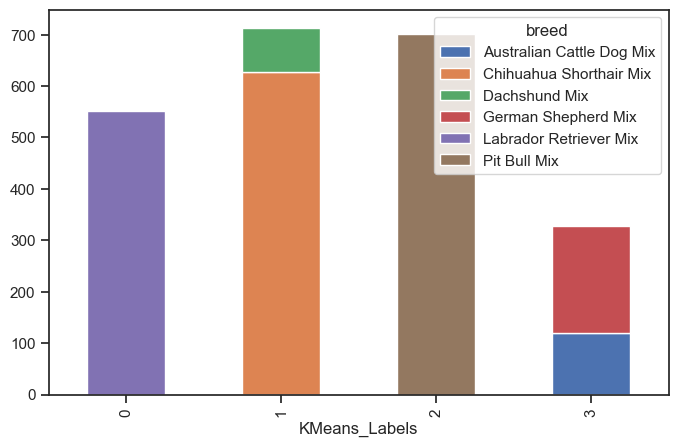

In [187]:
pd.crosstab(df_top6_breed_copy['breed'], df_top6_breed_copy['KMeans_Labels']).T.plot(kind = 'bar', stacked = True, figsize=(8,5))
plt.show()

From the crosstab above we can already seen that the clustering procedure works quite well and tends to cluster together dogs with the same breed

The number of dogs in each cluster is the following:

In [188]:
np.unique(kmeans_top6.labels_, return_counts=True)

(array([0, 1, 2, 3]), array([552, 713, 701, 328], dtype=int64))

And the Silhouette score for this clustrization is:

In [189]:
silhouette_score(X_top6, kmeans_top6.labels_)

0.39196624361509963

The Silhouette score in this case is $\sim 0.39$, so restricting only to the top $6$ breeds we obtain a better clusterization result. This was to be expected because restricting the dataset we have less variability in the dog characteristics.

Let's do some plots also in this case:

The following scatter matrices compare the result of the clustering with the grouping by `breed`. The attributes used are: `good_with_children`, `good_with_other_dogs`, `good_with_strangers`, `playfulness`, `protectiveness`, `trainability`, `energy`, `barking`, `shedding`, `grooming`, `drooling` and `coat_length`.

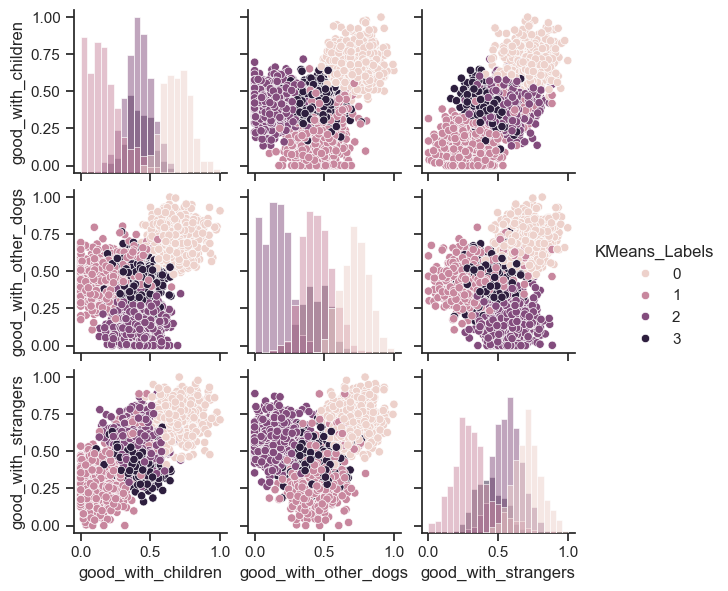

In [190]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'KMeans_Labels', height=2)

plt.show()

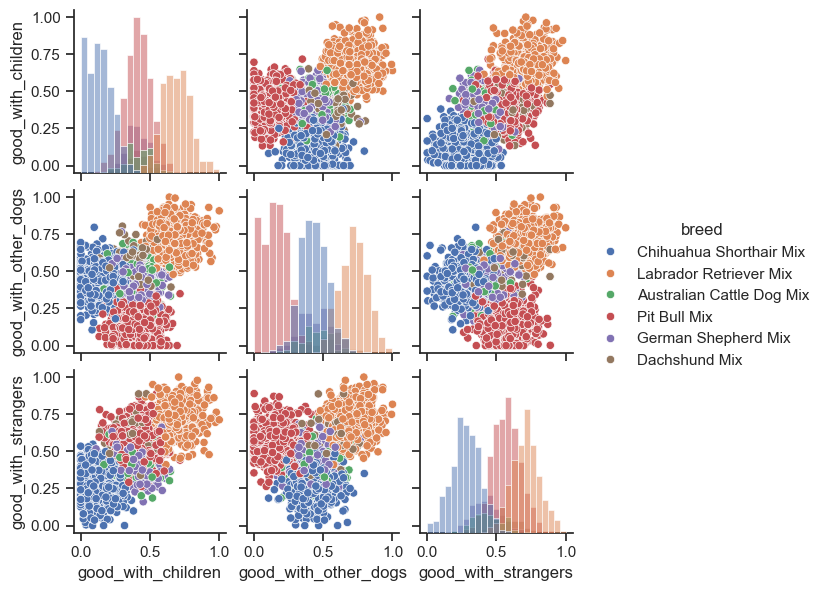

In [191]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'breed', height=2)

plt.show()

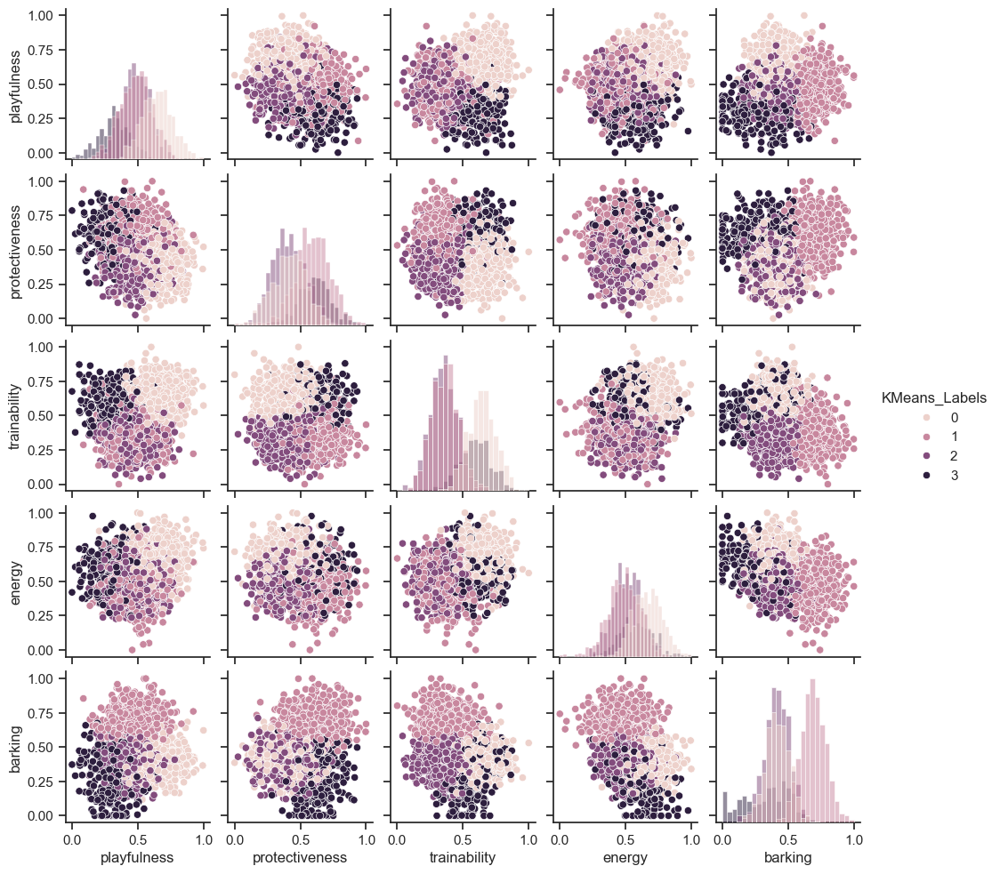

In [192]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'KMeans_Labels', height=2)

plt.show()

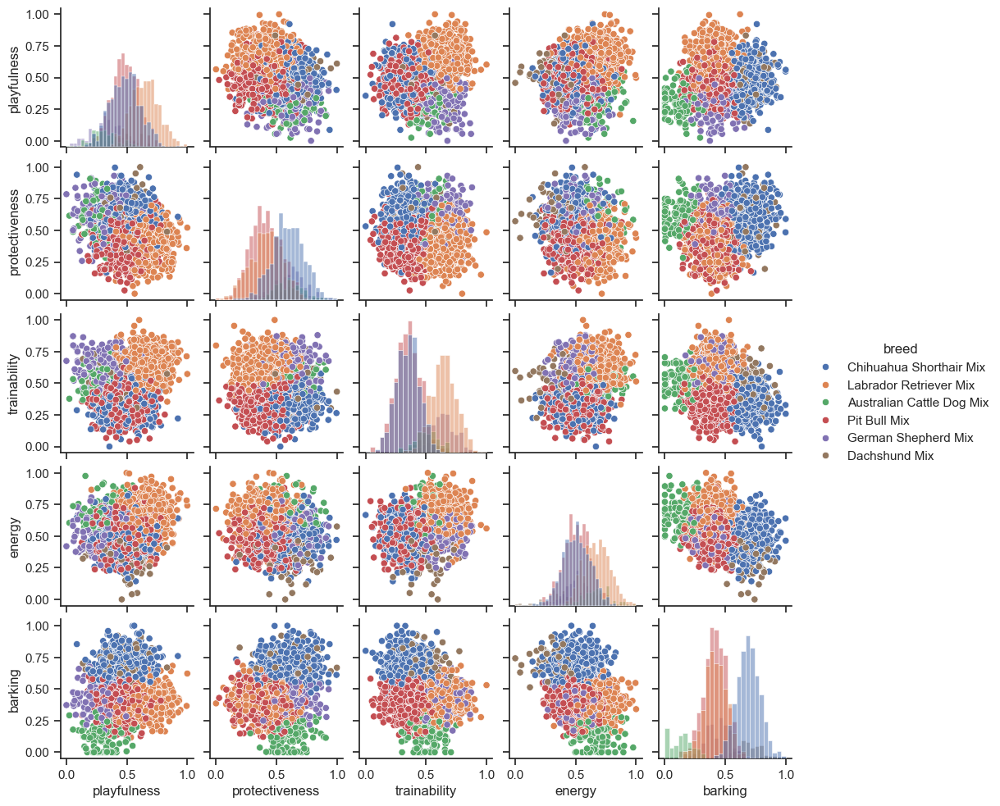

In [193]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'breed', height=2)

plt.show()

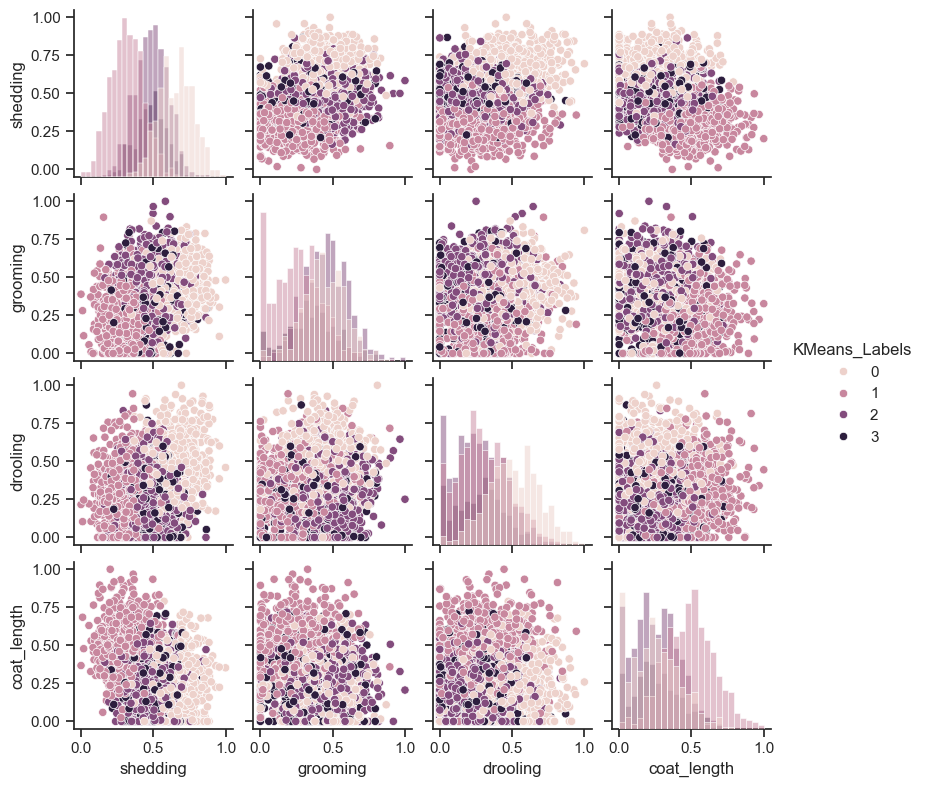

In [194]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'KMeans_Labels', height=2)

plt.show()

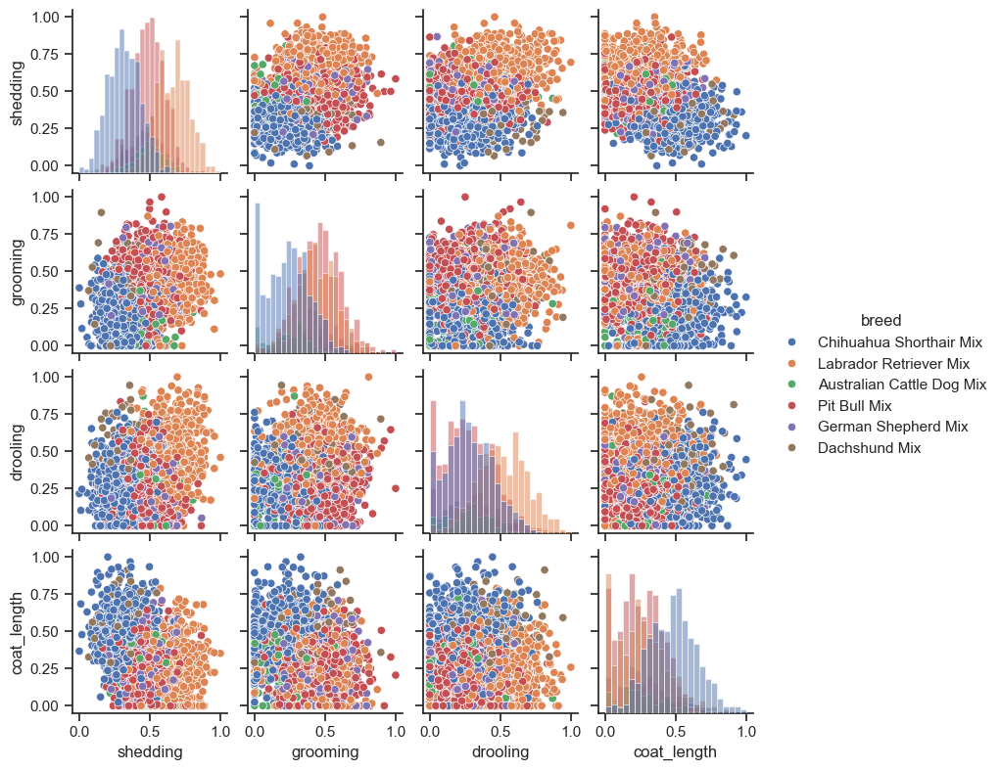

In [195]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'breed', height=2)

plt.show()

Differently from the case with all the breeds, in the restricted the dataset with only to the top 6 breeds it's evident that the clusterization tends to work as a grouping by breeds.

Let's now if the same results can be deduced also by using the t-SNE dimensionality reduction technique. We use the t-SNE since it preserves the local structure of the space of attributes.

First, we apply the t-SNE to the top 6 dataset and color differently data of dogs of different breeds:

In [196]:
colors = {}

for i,breed in enumerate(df_top6_breed_copy['breed'].unique()):
    colors[breed] = i

print(colors)

{'Chihuahua Shorthair Mix': 0, 'Labrador Retriever Mix': 1, 'Australian Cattle Dog Mix': 2, 'Pit Bull Mix': 3, 'German Shepherd Mix': 4, 'Dachshund Mix': 5}


In [197]:
df_top6_breed_copy['breed'].map(colors)

2       0
8       1
10      1
12      0
13      2
       ..
4368    1
4369    5
4370    2
4371    3
4373    3
Name: breed, Length: 2294, dtype: int64

In [198]:
tsne = TSNE(n_components=2)
X_top6_tsne = tsne.fit_transform(X_top6)

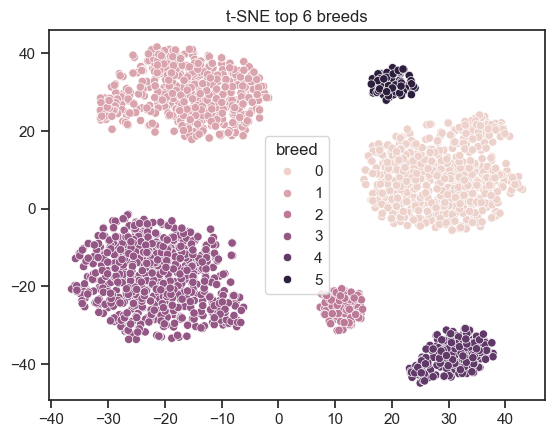

In [199]:
sns.scatterplot(x = X_top6_tsne[:, 0], y = X_top6_tsne[:, 1], hue=df_top6_breed_copy['breed'].map(colors))
plt.title('t-SNE top 6 breeds')
plt.show()

The above result can be now compared with the same t-SNE but with colors corresponding to different clusters:

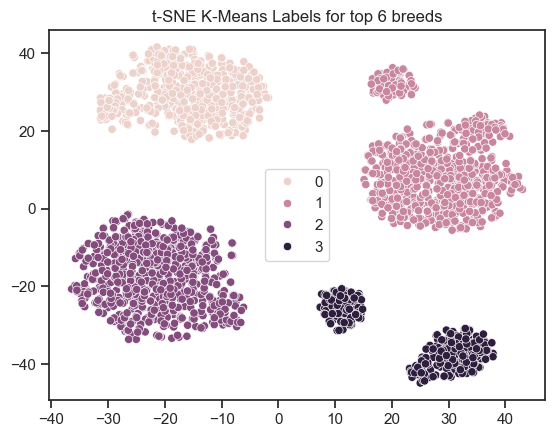

In [200]:
sns.scatterplot(x = X_top6_tsne[:, 0], y = X_top6_tsne[:, 1], hue=kmeans_top6.labels_)
plt.title('t-SNE K-Means Labels for top 6 breeds')
plt.show()

The result is quite significative and confirms visually what we have already seen above, in particular the first 3 breeds purely corresponds to the three big clusters while the second 3 breeds are splitted between one of the big clusters and another new cluster. This was to be expected since we are creating 4 clusters out of a 6 breed grouping.

Of course when considering the whole dataset with all of the breeds instead, the result is not interpretable in the sense of 1 to 1 breed correspondance. The following plot is the corresponding t-SNE with colors defined by the cluster labels:

In [201]:
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

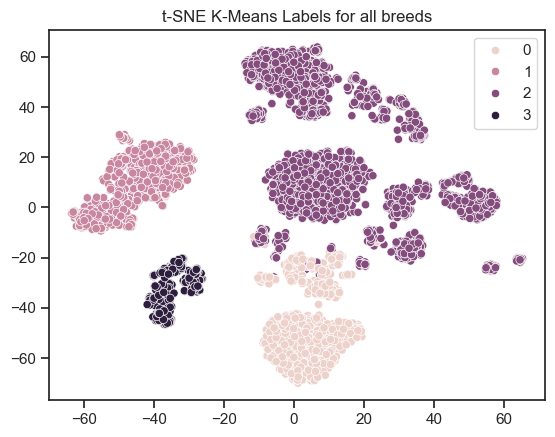

In [202]:
sns.scatterplot(x = X_tsne[:, 0], y = X_tsne[:, 1], hue=kmeans.labels_)
plt.title('t-SNE K-Means Labels for all breeds')
plt.show()

Actually, also the Bisecting K-Means had been used at first but since the results were almost identical to the K-Means ones, I decided to leave in the notebook only the latter.

## Density-based
- choose the correct parameters
- evaluate quantitatively and qualitatively

Let's now switch to density-based clustering algorithms

In order to choose the parameters $\epsilon$ and 'min points' we plot the k-th nearest neighbor distance against the datapoints sorted according to the distance of k-th nearest neighbor where k = min points. We repeat this plot for different values of k.

In [203]:
list_of_min_pts_th_distances = list()
for min_pts in [4, 8, 16, 32, 64]:

    D = squareform(pdist(X))

    min_pts_th_distances = list()

    for i in range(len(X)):
        min_pts_th_distances.append(sorted(D[i])[min_pts+1])
    
    list_of_min_pts_th_distances.append(min_pts_th_distances)

This is the plot described above when considering the whole dataset:

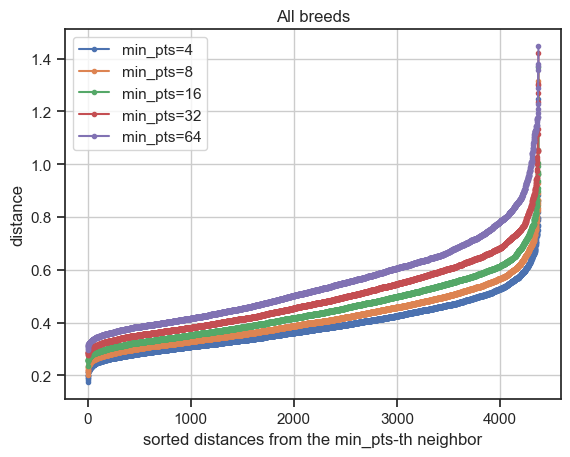

In [204]:
for i, min_pts in enumerate([4, 8, 16, 32, 64]):
    min_pts_th_distances = list_of_min_pts_th_distances[i]
    plt.plot(np.arange(len(X)), sorted(min_pts_th_distances), marker='.', label='min_pts=%s' % min_pts)

    plt.grid()
plt.title('All breeds')
plt.legend()
plt.xlabel('sorted distances from the min_pts-th neighbor')
plt.ylabel('distance')
plt.show()

In [205]:
list_of_min_pts_th_distances_top6 = list()
for min_pts in [4, 8, 16, 32, 64]:

    D = squareform(pdist(X_top6))

    min_pts_th_distances_top6 = list()

    for i in range(len(X_top6)):
        min_pts_th_distances_top6.append(sorted(D[i])[min_pts+1])
    
    list_of_min_pts_th_distances_top6.append(min_pts_th_distances_top6)

While this is the plot described above when considering only the top 6 breeds:

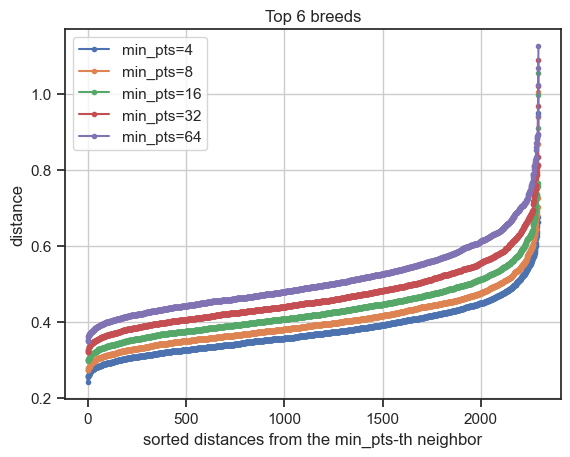

In [206]:
for i, min_pts in enumerate([4, 8, 16, 32, 64]):
    min_pts_th_distances_top6 = list_of_min_pts_th_distances_top6[i]
    plt.plot(np.arange(len(X_top6)), sorted(min_pts_th_distances_top6), marker='.', label='min_pts=%s' % min_pts)

    plt.grid()
plt.title('Top 6 breeds')
plt.legend()
plt.xlabel('sorted distances from the min_pts-th neighbor')
plt.ylabel('distance')
plt.show()

For the whole dataset case a good choice (in order maximize the number of core points) for the parameter could be $\epsilon = 0.65$ and min points = $8$ (actually the choice of 'min points' has some arbitrarity, the important thing is to consider the right corresponding $\epsilon$).

In [207]:
dbscan_breed = DBSCAN(eps=0.65, min_samples=8)
dbscan_breed.fit(X)

DBSCAN(eps=0.65, min_samples=8)

With this choice the are $4$ clusters and $16$ noise points

In [208]:
labels, counts = np.unique(dbscan_breed.labels_, return_counts=True)
for i, l in enumerate(labels):
    if l == -1:
        print('Noise: %s (%.2f)' % (counts[i], counts[i]/len(X)))
    else:
        print('Cluster %s: %s (%.2f)' % (l, counts[i], counts[i]/len(X)))

Noise: 16 (0.00)
Cluster 0: 3195 (0.73)
Cluster 1: 64 (0.01)
Cluster 2: 786 (0.18)
Cluster 3: 313 (0.07)


When dealing with DBSCAN always remember to remove the noise since it doesn't belong to any cluster. 

In [209]:
df_breed_copy['DBSCAN_Labels'] = dbscan_breed.labels_

The corresponding Silhouette score is the following: 

In [210]:
idx = df_breed_copy['DBSCAN_Labels'].values != -1
idx_noise = df_breed_copy['DBSCAN_Labels'].values == -1
silhouette_score(X[idx], df_breed_copy['DBSCAN_Labels'].values[idx]) 

0.38211128224841984

When considering all the breeds, the above Silhouette score tells us that the DBSCAN algorithm performs a better clustering. Anyway we have to remember that DBSCAN being a density based algorithm tends to create bigger clusters when the dataset is particularly dense (as in our case).

The following scatter matrices compare the result of the clustering with the grouping by `breed`. The attributes used are: `good_with_children`, `good_with_other_dogs`, `good_with_strangers`, `playfulness`, `protectiveness`, `trainability`, `energy`, `barking`, `shedding`, `grooming`, `drooling` and `coat_length`.

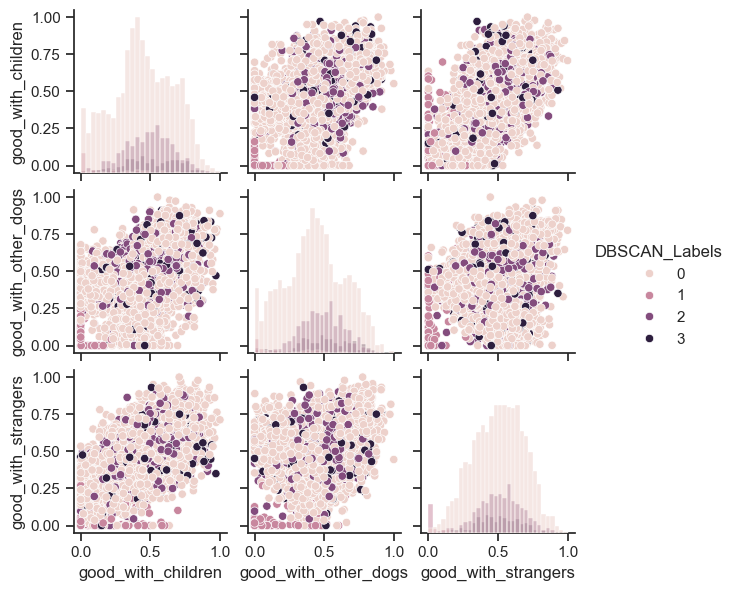

In [211]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy[df_breed_copy['DBSCAN_Labels'] != -1], diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'DBSCAN_Labels', height=2)

plt.show()

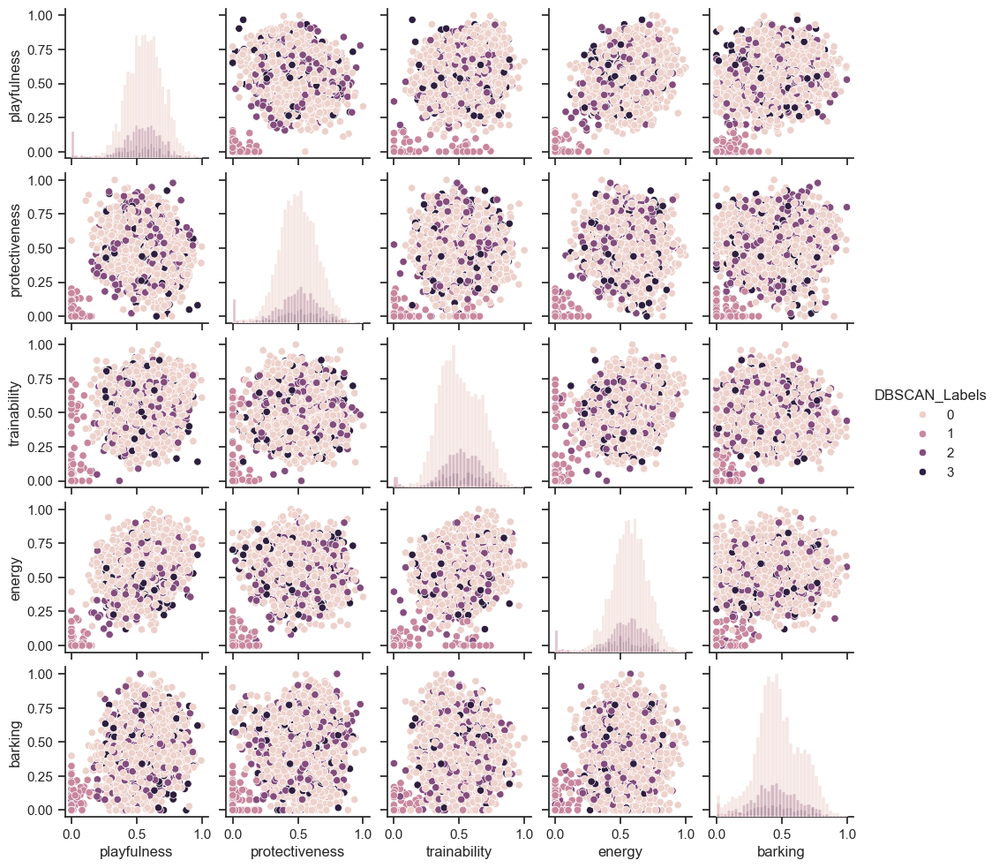

In [212]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy[df_breed_copy['DBSCAN_Labels'] != -1], diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'DBSCAN_Labels', height=2)

plt.show()

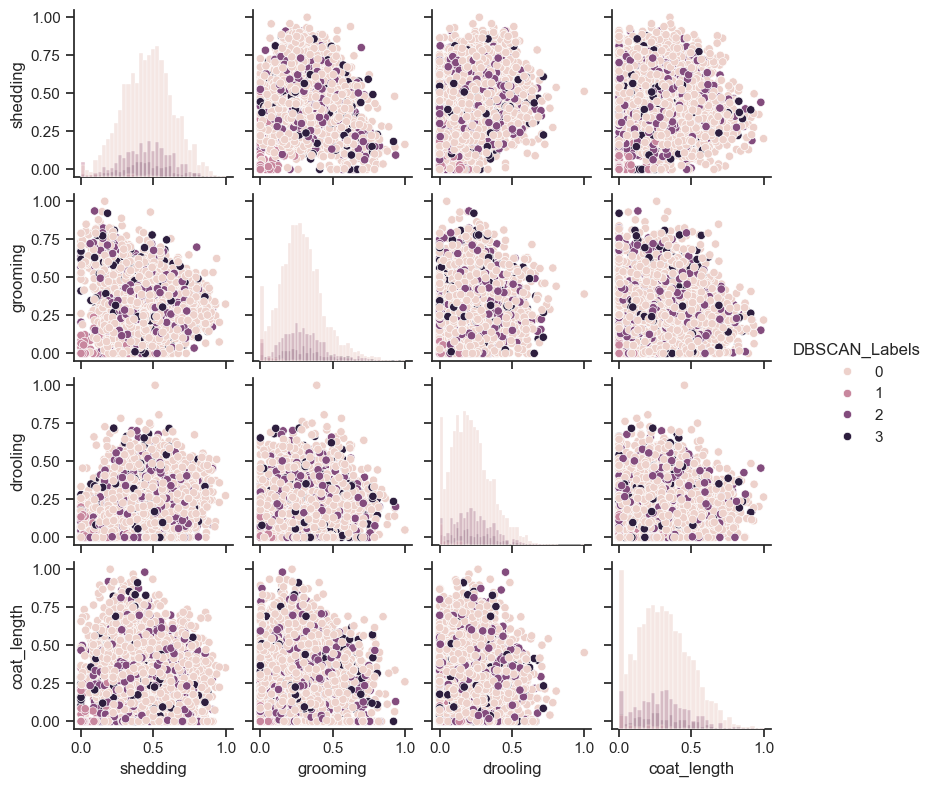

In [213]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy[df_breed_copy['DBSCAN_Labels'] != -1], diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'DBSCAN_Labels', height=2)

plt.show()

As in the center-based approach, also in this case it's not possible to have a direct visual interpretation of the results. Clearer visual results can be obtained by restricting the analysis to the top 6 breeds.

For the top 6 breeds case (by looking at the plot realized before) a good choice of the parameter could be $\epsilon = 0.49$ and min points = $8$:

In [214]:
dbscan_top6_breed = DBSCAN(eps=0.49, min_samples=8)
dbscan_top6_breed.fit(X_top6)

DBSCAN(eps=0.49, min_samples=8)

This parameter choice lead to $4$ clusters and $39$ noise points:

In [215]:
labels, counts = np.unique(dbscan_top6_breed.labels_, return_counts=True)
for i, l in enumerate(labels):
    if l == -1:
        print('Noise: %s (%.2f)' % (counts[i], counts[i]/len(X)))
    else:
        print('Cluster %s: %s (%.2f)' % (l, counts[i], counts[i]/len(X)))

Noise: 39 (0.01)
Cluster 0: 546 (0.12)
Cluster 1: 694 (0.16)
Cluster 2: 816 (0.19)
Cluster 3: 199 (0.05)


In [216]:
df_top6_breed_copy['DBSCAN_Labels'] = dbscan_top6_breed.labels_

Having a small number of breeds, in this case it can be useful to do a crosstab between the 6 breeds and the DBSCAN labels

In [217]:
pd.crosstab(df_top6_breed_copy['breed'], df_top6_breed_copy['DBSCAN_Labels'])

DBSCAN_Labels,-1,0,1,2,3
breed,,,,,
Australian Cattle Dog Mix,4,0,0,116,0
Chihuahua Shorthair Mix,6,0,622,0,0
Dachshund Mix,13,0,72,0,0
German Shepherd Mix,9,0,0,0,199
Labrador Retriever Mix,6,546,0,0,0
Pit Bull Mix,1,0,0,700,0


and graphically:

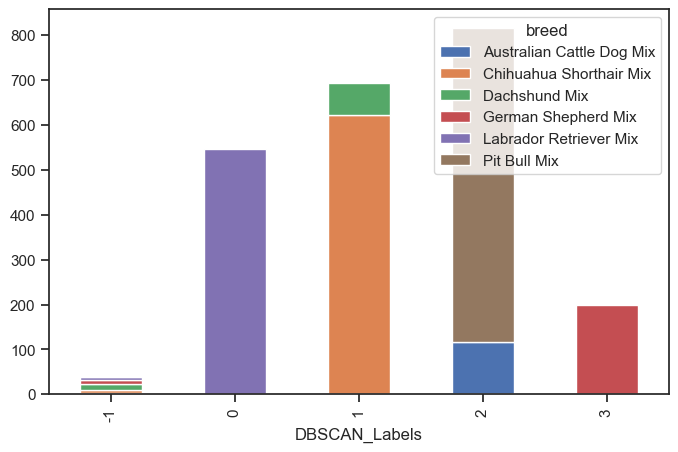

In [218]:
pd.crosstab(df_top6_breed_copy['breed'], df_top6_breed_copy['DBSCAN_Labels']).T.plot(kind = 'bar', stacked = True, figsize=(8,5))
plt.show()

From the crosstab above we can already seen that the clustering procedure works quite well and tends to cluster together dogs with the same breed.

And the corresponding Silhouette score is:

In [219]:
idx = df_top6_breed_copy['DBSCAN_Labels'].values != -1
idx_noise = df_top6_breed_copy['DBSCAN_Labels'].values == -1
silhouette_score(X_top6[idx], df_top6_breed_copy['DBSCAN_Labels'].values[idx]) 

0.3898649846397338

When considering only the top $6$ breeds, the K-Means and the DBSCAN provide similar results for the Silhouette score.

The following scatter matrices compare the result of the clustering with the grouping by `breed`. The attributes used are: `good_with_children`, `good_with_other_dogs`, `good_with_strangers`, `playfulness`, `protectiveness`, `trainability`, `energy`, `barking`, `shedding`, `grooming`, `drooling` and `coat_length`.

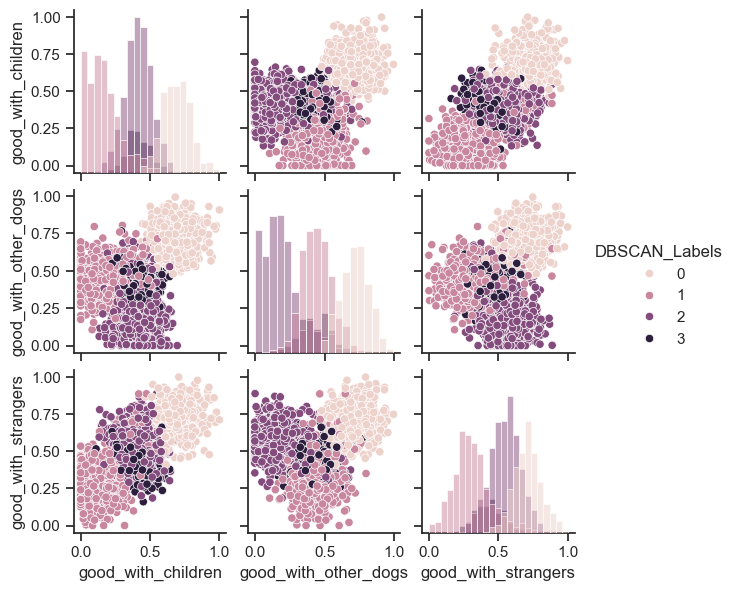

In [220]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy[df_top6_breed_copy['DBSCAN_Labels'] != -1], diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'DBSCAN_Labels', height=2)

plt.show()

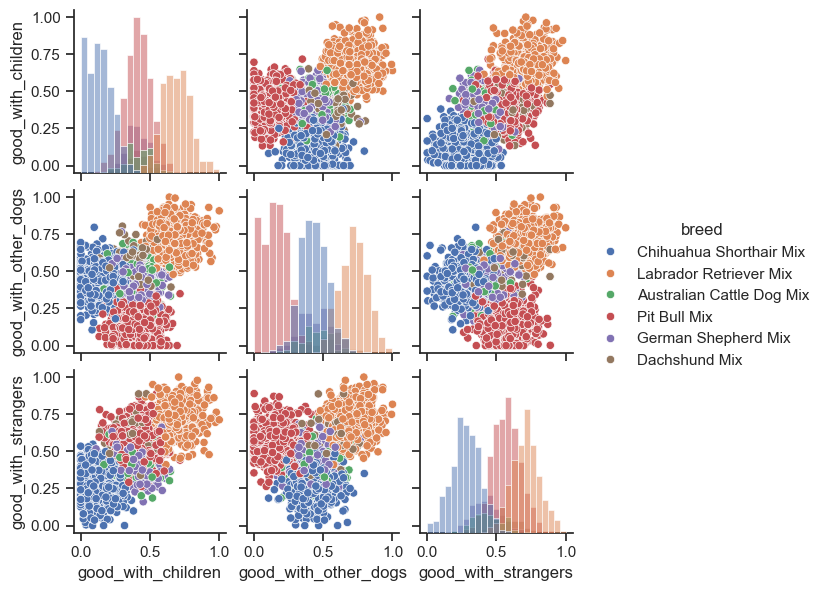

In [221]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'breed', height=2)

plt.show()

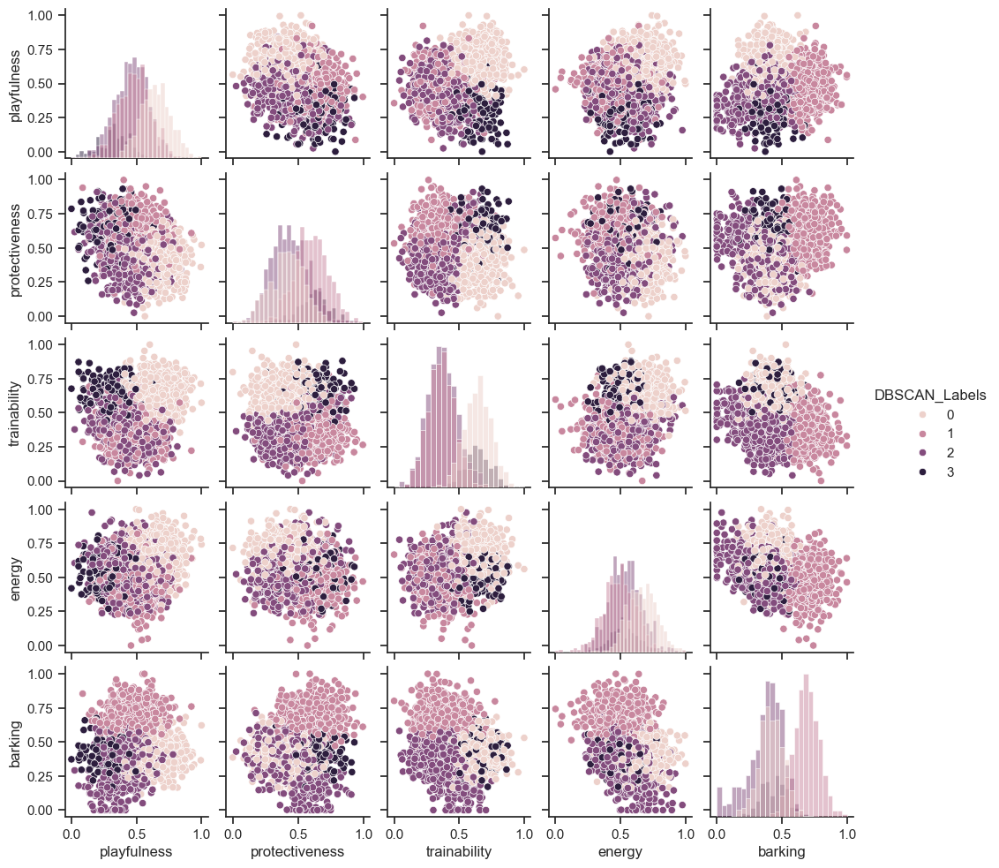

In [222]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy[df_top6_breed_copy['DBSCAN_Labels'] != -1], diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'DBSCAN_Labels', height=2)

plt.show()

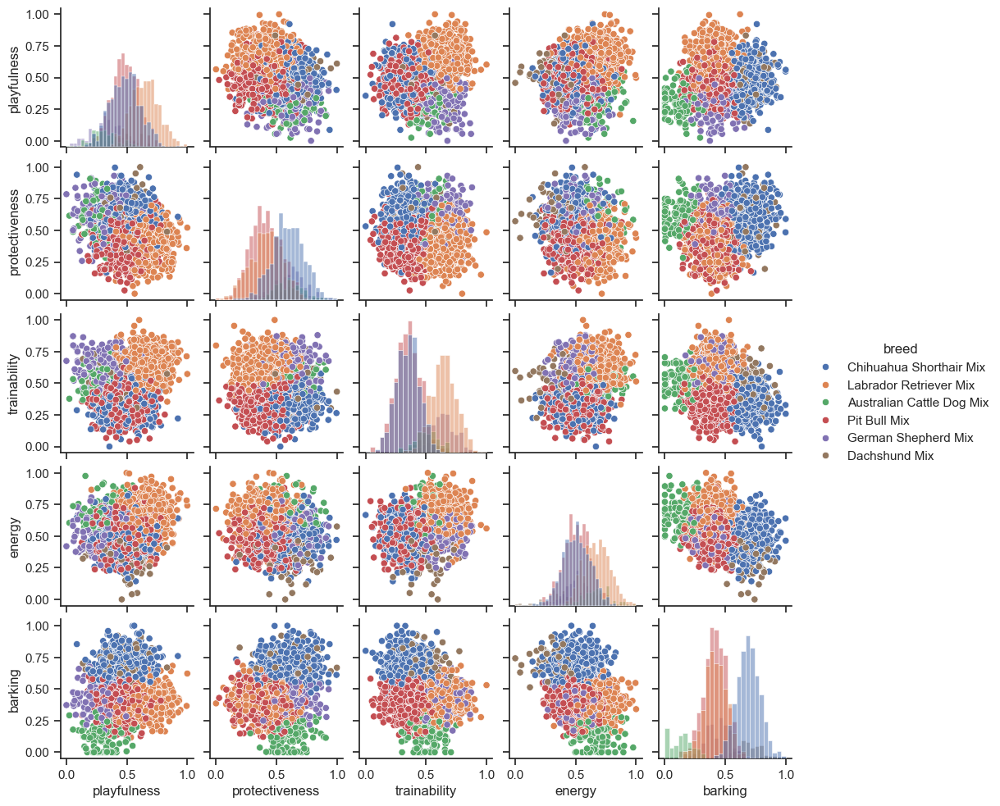

In [223]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'breed', height=2)

plt.show()

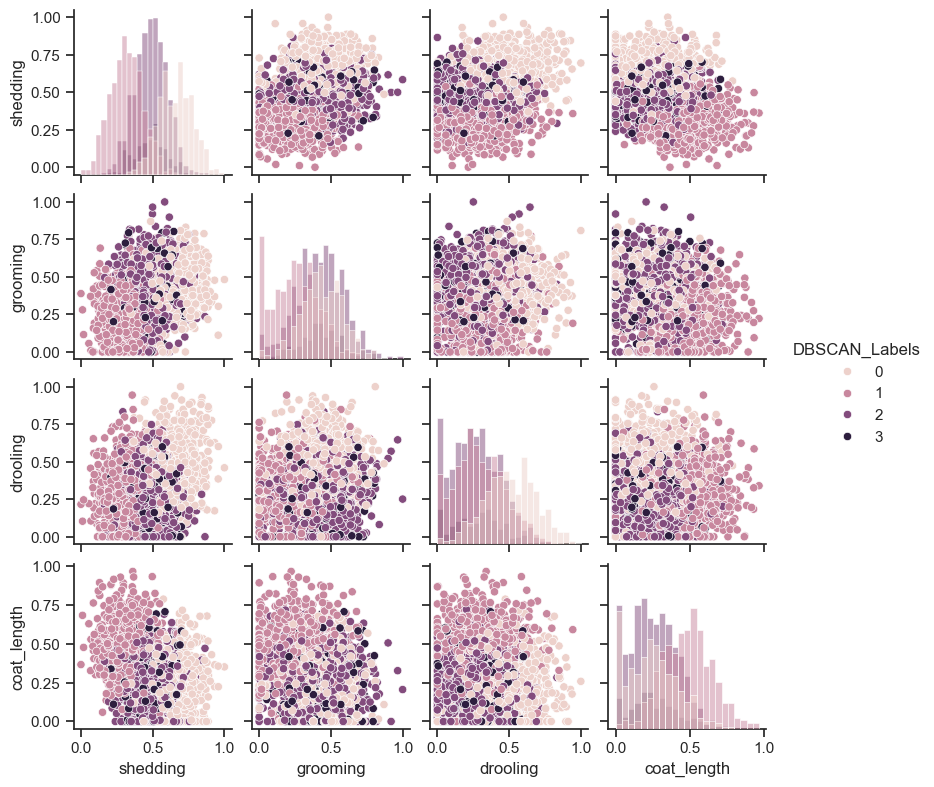

In [224]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy[df_top6_breed_copy['DBSCAN_Labels'] != -1], diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'DBSCAN_Labels', height=2)

plt.show()

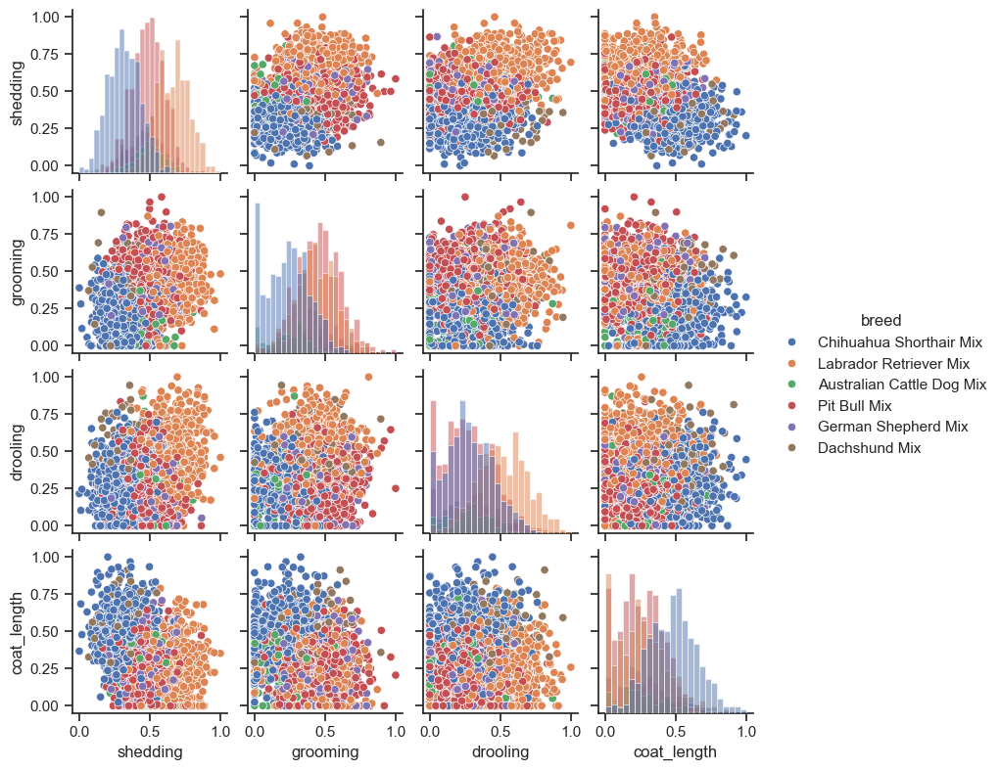

In [225]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'breed', height=2)

plt.show()

As in the center-based approach, in the restricted the dataset with only to the top 6 breeds it's evident that the clusterization tends to work as a grouping by breeds.

We can do also in this case the same analysis of the previous section with the t-SNE:

First, we apply the t-SNE to the top 6 dataset and color differently data of dogs of different breeds:

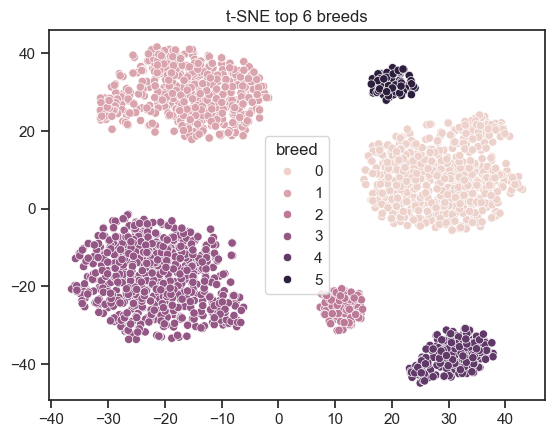

In [226]:
sns.scatterplot(x = X_top6_tsne[:, 0], y = X_top6_tsne[:, 1], hue=df_top6_breed_copy['breed'].map(colors))
plt.title('t-SNE top 6 breeds')
plt.show()

The above result can be now compared with the same t-SNE but with colors corresponding to different clusters:

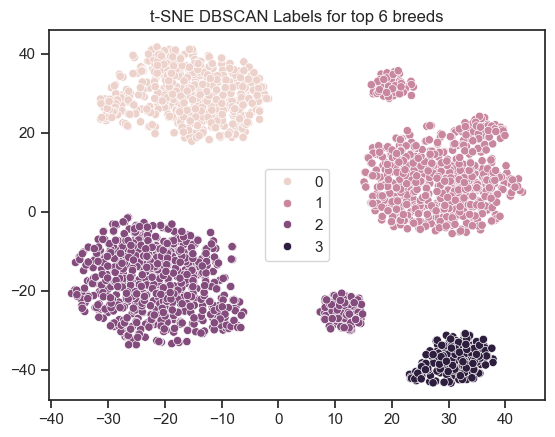

In [227]:
idx = df_top6_breed_copy['DBSCAN_Labels'].values != -1

sns.scatterplot(x = X_top6_tsne[idx][:,0], y = X_top6_tsne[idx][:,1], hue=df_top6_breed_copy[df_top6_breed_copy['DBSCAN_Labels'] != -1]['DBSCAN_Labels'].values)
plt.title('t-SNE DBSCAN Labels for top 6 breeds')
plt.show()

The clustering division is of course different from the center-based case but the qualitative result is the same: the first 3 breeds purely corresponds to the three big clusters while the second 3 breeds are splitted between two of the big clusters and another new cluster. This was to be expected since we are creating 4 clusters out of a 6 breed grouping.

Of course when considering the whole dataset with all of the breeds instead, the result is not interpretable in the sense of 1 to 1 breed correspondance. The following plot is the corresponding t-SNE with colors defined by the cluster labels:

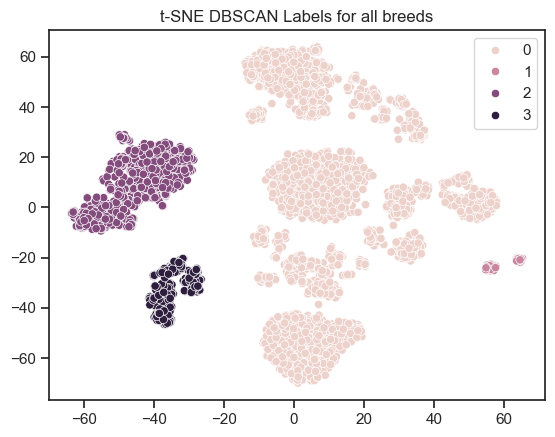

In [228]:
idx = df_breed_copy['DBSCAN_Labels'].values != -1

sns.scatterplot(x = X_tsne[idx][:,0], y = X_tsne[idx][:,1], hue=df_breed_copy[df_breed_copy['DBSCAN_Labels'] != -1]['DBSCAN_Labels'].values)
plt.title('t-SNE DBSCAN Labels for all breeds')
plt.show()

As already said, differently from the center-based case, in the density-based approach (especially when applied to the whole dataset) there is an evident tendency of forming bigger clusters. This was to be expected by the way the density-based clustering works. 

## Hierarchical
- choose the correct parameters
- show and discuss different dendograms using different algorithms
- evaluate quantitatively and qualitatively

Eventually, let's also consider the hierarchical clustering approach.

As always we consider firstly the whole dataset and then we restrict it to the case of top 6 breeds.

The first thing to do is to calculate di distance matrix (done by using the euclidean metric):

In [229]:
D = pdist(X, metric='euclidean')

Then, by using `linkage` that iteratively merges the closest clusters based on a specified linkage criterion (e.g., single, complete, average, ward, etc.), the linkage matrix is returned, which contains information about the merging process.

In [230]:
link = linkage(D, method='complete', metric='euclidean')

In this case the `method = 'complete'` has been used. This is firstly because complete linkage (as well as the Ward one which will be used below) works well with globular clusters (as the ones we have) and secondly for the practical reason that with this choice it was easier (differently from the single linkage case) to cut the dendrogram in a way to have a similar number of clusters to the one obtained with the methods of the previous sections. The `method = 'ward'` gives similar results but in this case the complete linkage has been used.

Starting from the linkage matrix a dendrogram can be visualized. At this step we can decide where to cut such tree-structure to obtain a certain number of clusters:

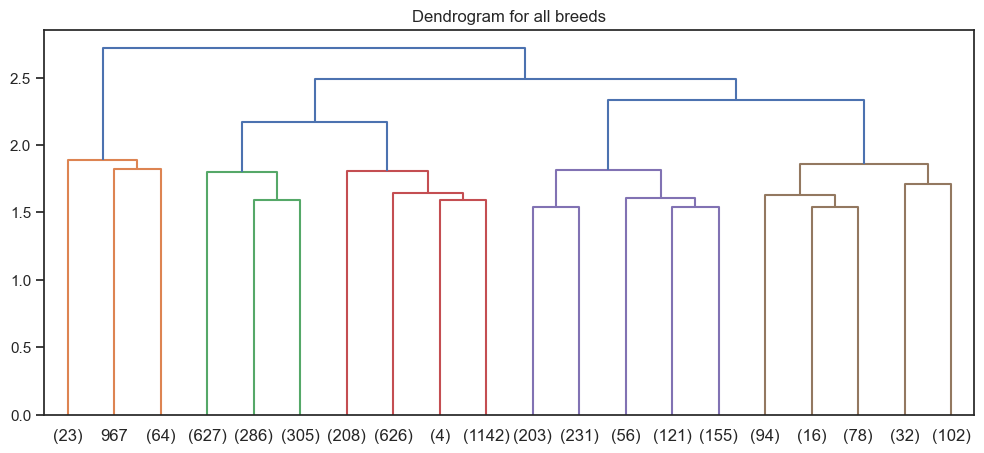

In [231]:
plt.figure(figsize=(12,5))
res = dendrogram(link, truncate_mode='lastp', p=20, color_threshold=2)
plt.title('Dendrogram for all breeds')
plt.show()

In [232]:
agg_labels = fcluster(link, t=2, criterion='distance')

With the above selection of parameters $5$ clusters are obtained:

In [233]:
labels, counts = np.unique(agg_labels, return_counts=True)
for i, l in enumerate(labels):
    if l == -1:
        print('Noise: %s (%.2f)' % (counts[i], counts[i]/len(X)))
    else:
        print('Cluster %s: %s (%.2f)' % (l, counts[i], counts[i]/len(X)))

Cluster 1: 88 (0.02)
Cluster 2: 1218 (0.28)
Cluster 3: 1980 (0.45)
Cluster 4: 766 (0.18)
Cluster 5: 322 (0.07)


And the corresponding Silhouette score is:

In [234]:
silhouette_score(X, agg_labels)

0.29625481561434597

By considering the whole dataset, the Silhouette score in this hierarchical case is lower than both the scores obtained with K-Means and DBSCAN.

In [235]:
df_breed_copy['Agg_Labels'] = agg_labels

The following scatter matrices compare the result of the clustering with the grouping by `breed`. The attributes used are: `good_with_children`, `good_with_other_dogs`, `good_with_strangers`, `playfulness`, `protectiveness`, `trainability`, `energy`, `barking`, `shedding`, `grooming`, `drooling` and `coat_length`.

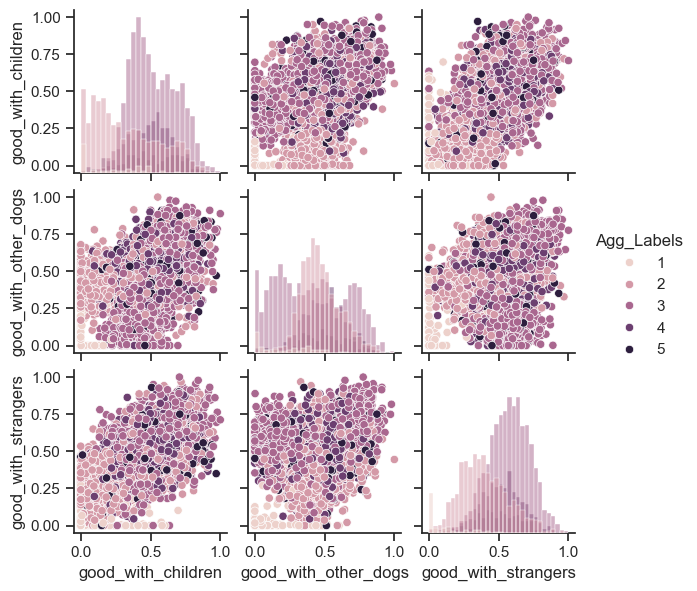

In [236]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy, diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'Agg_Labels', height=2)

plt.show()

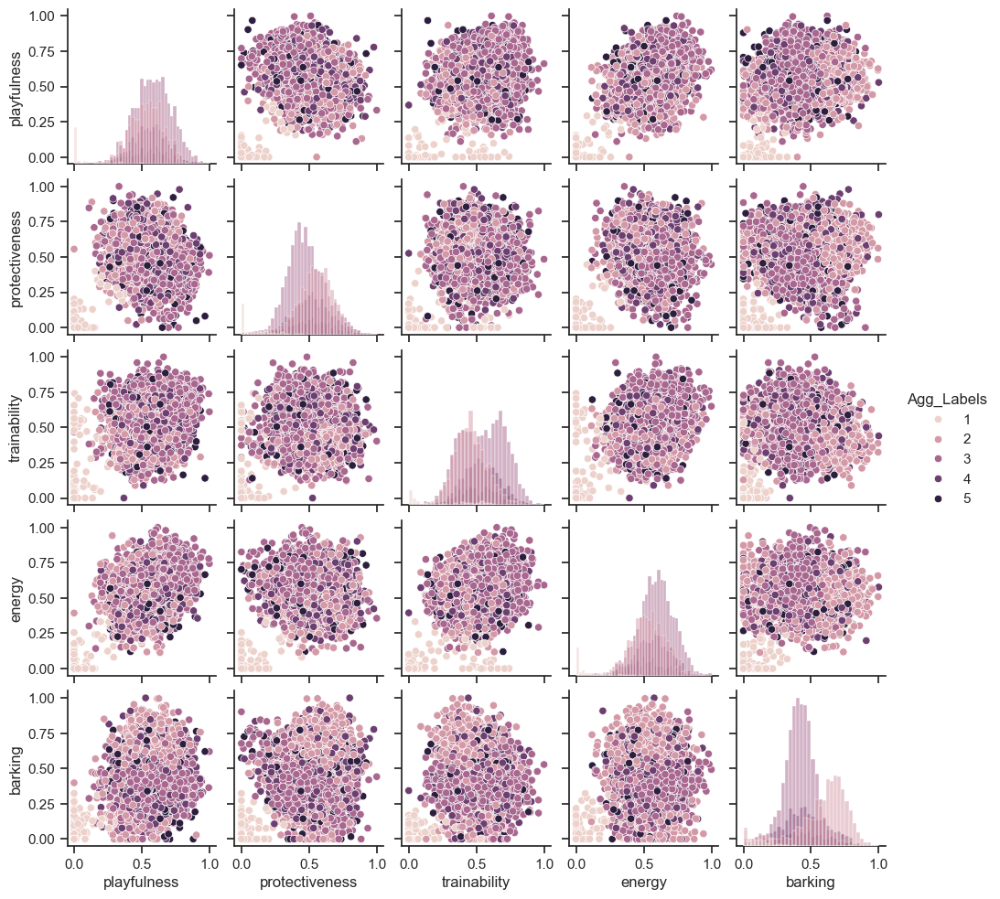

In [237]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy, diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'Agg_Labels', height=2)

plt.show()

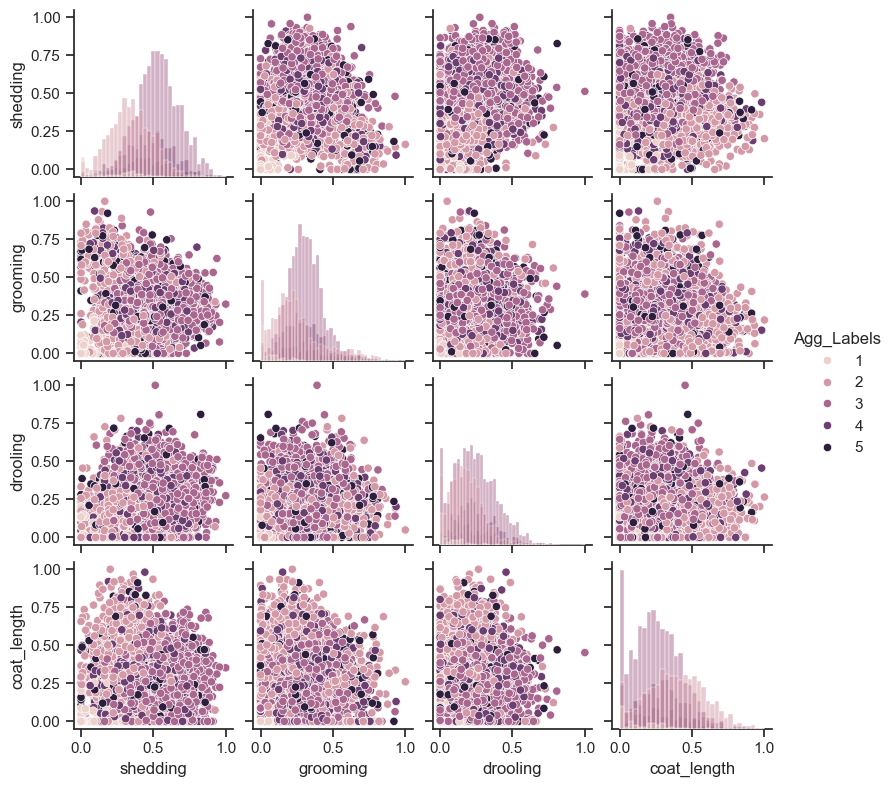

In [238]:
sns.set_theme(style="ticks")
sns.pairplot(df_breed_copy, diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'Agg_Labels', height=2)

plt.show()

Also in this case it's not possible to have a direct visual interpretation of the results. Clearer visual results can be obtained by restricting the analysis to the top 6 breeds.

We proceed analogously as before to perform the hierarchical clustering also in restricted dataset with only top 6 breeds:

In [239]:
D_top6 = pdist(X_top6, metric='euclidean')

In [240]:
link_top6 = linkage(D_top6, method='ward', metric='euclidean')

Here the `method = 'ward'` has been chosen for the same reasons of the `complete` linkage in the full dataset case. Actually we could have used the `complete` linkage also in this case. The `ward` linkage has been chosen to differentiate the two analyses.

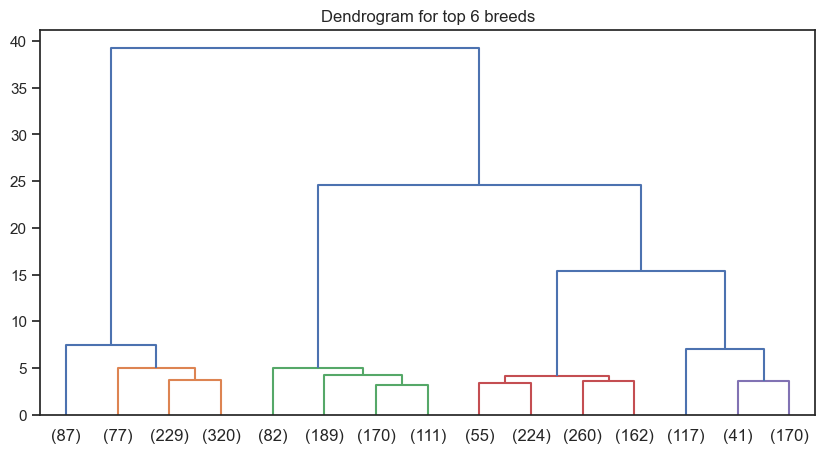

In [241]:
plt.figure(figsize=(10,5))
res_top6 = dendrogram(link_top6, truncate_mode='lastp', p=15, color_threshold=5.2)
plt.title('Dendrogram for top 6 breeds')
plt.show()

In [242]:
agg_top6_labels = fcluster(link_top6, t=5.2, criterion='distance')

We the above choice of the parameters $6$ clusters are formed:

In [243]:
labels, counts = np.unique(agg_top6_labels, return_counts=True)
for i, l in enumerate(labels):
    if l == -1:
        print('Noise: %s (%.2f)' % (counts[i], counts[i]/len(X)))
    else:
        print('Cluster %s: %s (%.2f)' % (l, counts[i], counts[i]/len(X)))

Cluster 1: 87 (0.02)
Cluster 2: 626 (0.14)
Cluster 3: 552 (0.13)
Cluster 4: 701 (0.16)
Cluster 5: 117 (0.03)
Cluster 6: 211 (0.05)


The corresponding Silhouette score is:

In [244]:
silhouette_score(X_top6, agg_top6_labels)

0.32091992441686207

For the top $6$ case the result of the hierarchical clustering is comparable to the ones obtained by using K-Means and DBSCAN.

In [245]:
df_top6_breed_copy['Agg_Labels'] = agg_top6_labels

Having a small number of breeds, in this case it can be useful to do a crosstab between the 6 breeds and the Hierarchical labels

In [246]:
pd.crosstab(df_top6_breed_copy['breed'], df_top6_breed_copy['Agg_Labels'])

Agg_Labels,1,2,3,4,5,6
breed,,,,,,
Australian Cattle Dog Mix,0,0,0,0,117,3
Chihuahua Shorthair Mix,2,626,0,0,0,0
Dachshund Mix,85,0,0,0,0,0
German Shepherd Mix,0,0,0,0,0,208
Labrador Retriever Mix,0,0,552,0,0,0
Pit Bull Mix,0,0,0,701,0,0


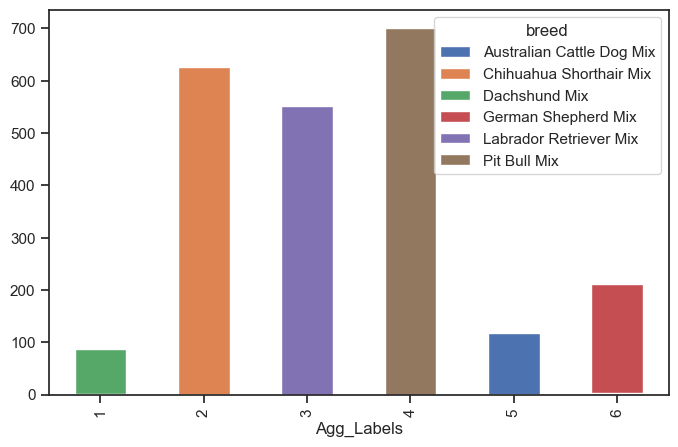

In [247]:
pd.crosstab(df_top6_breed_copy['breed'], df_top6_breed_copy['Agg_Labels']).T.plot(kind = 'bar', stacked = True, figsize=(8,5))
plt.show()

From the crosstab above we can already seen that the clustering procedure is almost perfect in this case and tends to cluster together (like a $1$ to $1$ correspondance) dogs with the same breed

Here again, the following scatter matrices compare the result of the clustering with the grouping by `breed`. The attributes used are: `good_with_children`, `good_with_other_dogs`, `good_with_strangers`, `playfulness`, `protectiveness`, `trainability`, `energy`, `barking`, `shedding`, `grooming`, `drooling` and `coat_length`.

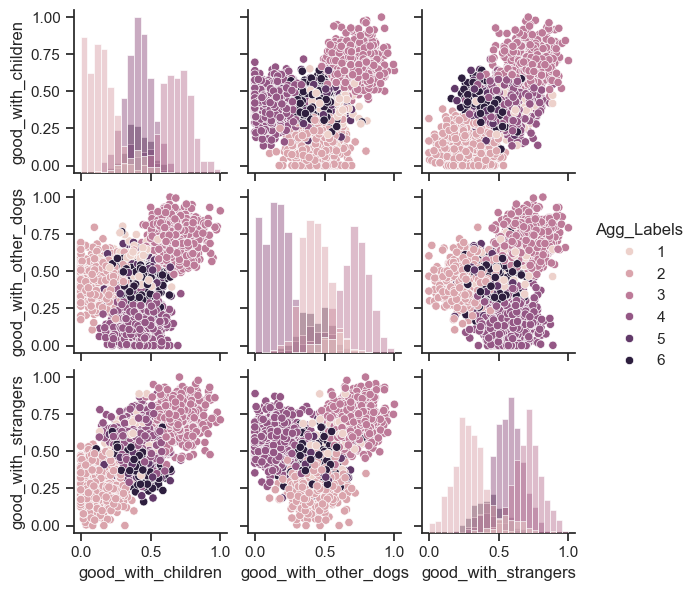

In [248]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    y_vars=['good_with_children', 'good_with_other_dogs', 'good_with_strangers'],
    hue = 'Agg_Labels', height=2)

plt.show()

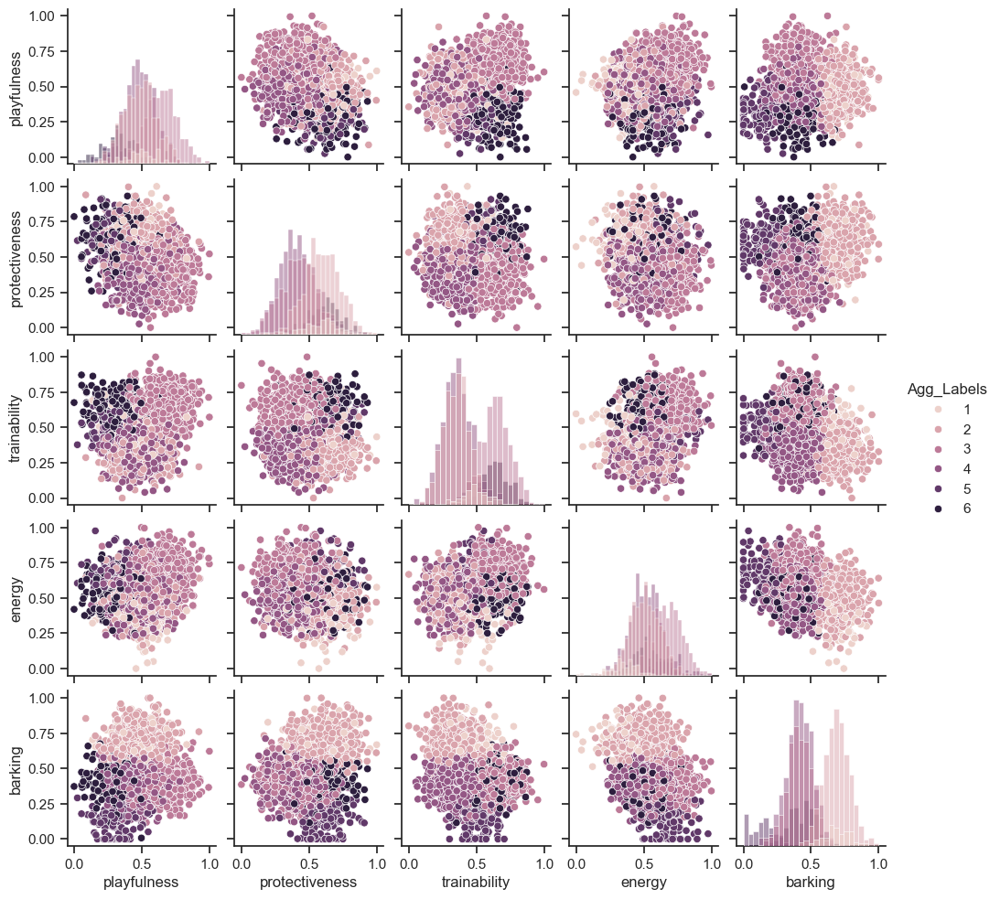

In [249]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    y_vars=['playfulness', 'protectiveness', 'trainability', 'energy', 'barking'],
    hue = 'Agg_Labels', height=2)

plt.show()

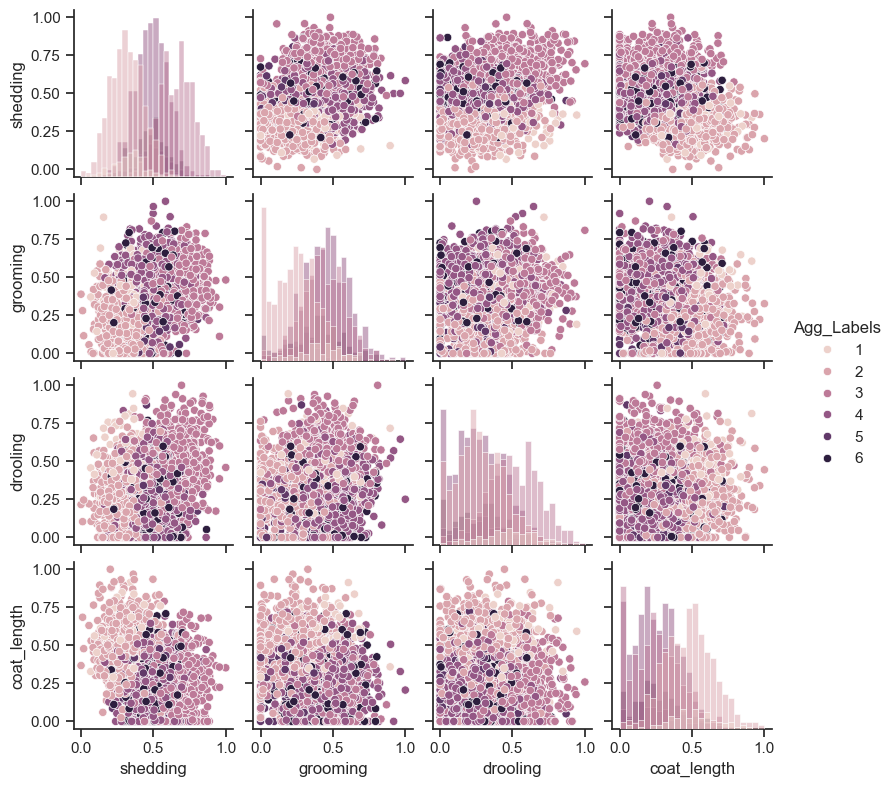

In [250]:
sns.set_theme(style="ticks")
sns.pairplot(df_top6_breed_copy, diag_kind="hist",
    x_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    y_vars=['shedding', 'grooming', 'drooling', 'coat_length'],
    hue = 'Agg_Labels', height=2)

plt.show()

In the restricted the dataset with only to the top 6 breeds it's evident that the clusterization tends to work as a grouping by breeds.

We can do also in this case the same analysis of the previous section with the t-SNE:

First, we apply the t-SNE to the top 6 dataset and color differently data of dogs of different breeds:

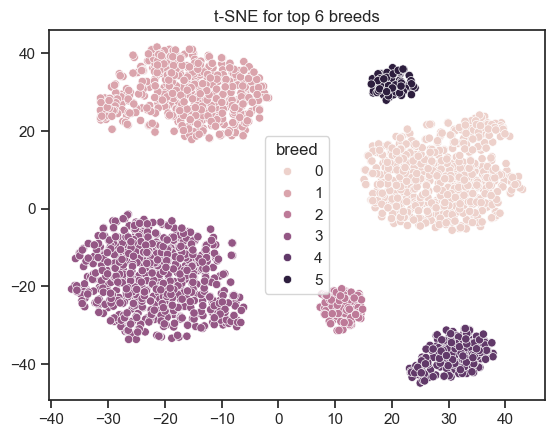

In [251]:
sns.scatterplot(x = X_top6_tsne[:, 0], y = X_top6_tsne[:, 1], hue=df_top6_breed_copy['breed'].map(colors))
plt.title('t-SNE for top 6 breeds')
plt.show()

The above result can be now compared with the same t-SNE but with colors corresponding to different clusters:

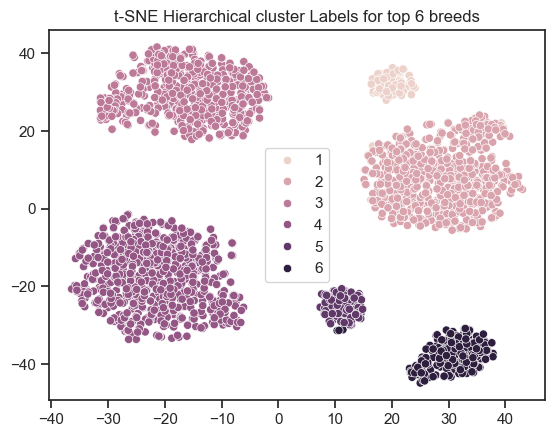

In [252]:
sns.scatterplot(x = X_top6_tsne[:, 0], y = X_top6_tsne[:, 1], hue=agg_top6_labels)
plt.title('t-SNE Hierarchical cluster Labels for top 6 breeds')
plt.show()

In this case the correspondance between cluster labels and top 6 breeds is almost perfect ($1$ to $1$). This is due to the fact that we have exactly $6$ clusters just like the number of top breeds.

Of course when considering the whole dataset with all of the breeds instead, the result is not interpretable in the sense of 1 to 1 breed correspondance. The following plot is the corresponding t-SNE with colors defined by the cluster labels:

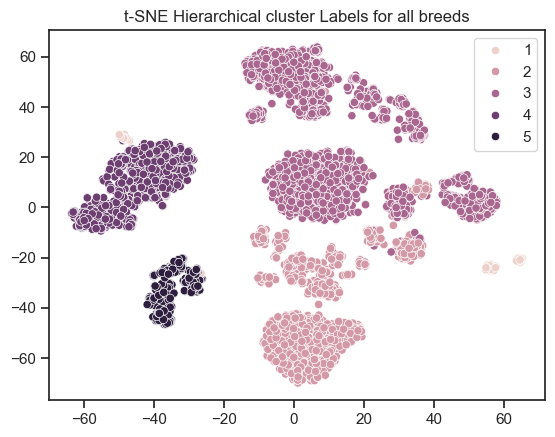

In [254]:
sns.scatterplot(x = X_tsne[:, 0], y = X_tsne[:, 1], hue=agg_labels)
plt.title('t-SNE Hierarchical cluster Labels for all breeds')
plt.show()

## Discussion
- summarize your findings and insights, also comparing the performance of each model

In general, when considering the whole dataset the clustering works quite well for all algorithms in terms of Silhouette metric (especially K-Means and DBSCAN) but by construction it is not able to create a direct correspondance between breeds and clustering labels. This is obvious since we are clustering more then $500$ breeds within a handful of clusters. It worths noticing that in this case DBSCAN, although good in terms of Silhouette, gives the less interesting results since (by the way a density-based algorithm works) it tends to create a very big cluster that contains the majority of the breeds. 

Even better results are obtained when restricting to the top $6$ breeds dataset. Also in this case the results are comparable for all algorithms (the best results in terms of Silhouette are again given by K-Means and DBSCAN) and the correspondance between cluster labels and breeds is very good. Considering this aspect, the Hierarchical clustering is the one that performs an almost perfect correspondance.